In [1]:
import h5py
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.optimize import curve_fit
import cv2
import statistics
import skimage as ski
from skimage.morphology import square,disk
from scipy import signal
from scipy import stats
from pathlib import Path
import numbers

## Define Existing BG Subtractions

In [2]:
#Load in Data function
def load_data(event_no,spectro_no):
    
    files = os.listdir('/eos/experiment/awake/event_data/2024/10/08')
    f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[event_no],'r')
    data = f['AwakeEventData'][f'TCC4.SPECTRO'+str(spectro_no)+'.DigiCam']['ExtractionImage']['image2D'][:]
    protons= f['AwakeEventData']['TT41.BCTF.412340']['CaptureAcquisition']['totalIntensity'][0]
    RIF = f['AwakeEventData']['Sps2AwakeSynchro']['ProtonDelayNs']['delay'][0]
    density = f['AwakeEventData']['TSG41.AWAKE-DENSITY-DATA']['ValueAcquisition']['floatValue'][2]
    
    
    return files,data, protons, RIF, density

In [3]:
def find_screens(event_no):
    files = os.listdir('/eos/experiment/awake/event_data/2024/10/08')
    f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[event_no],'r')
    
    OTR = f['AwakeEventData']['MPP-VACTRANS-OTR']['Acquisition']['end_switch_plus_active']
    CTR = f['AwakeEventData']['MPP-VACTRANS-CTR']['Acquisition']['end_switch_plus_active']
    LBDP2= f['AwakeEventData']['LBDP2']['Acq']['position'][0]
    
    return bool(OTR), bool(CTR), LBDP2

In [14]:
files = os.listdir('/eos/experiment/awake/event_data/2025/05/20')
f = h5py.File('/eos/experiment/awake/event_data/2025/05/20/'+files[10],'r')

In [19]:
#f['AwakeEventData']['TT41.BTV.412353.BTVI']['SisAcquisition']['screenIn'][0]
f['AwakeEventData']['TT41.BTV.412350.BTVI']['SisAcquisition']['screenIn'][0]

0

In [4]:
## all screens out
find_screens(150)

(True, True, 0)

In [5]:
files = os.listdir('/eos/experiment/awake/event_data/2024/10/08')
f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[500],'r')
OTR = f['AwakeEventData']['MPP-VACTRANS-OTR']['Acquisition']['end_switch_plus_active']
bool(OTR)

True

In [48]:
#Load in Data function
def load_rif(event_no,spectro_no):
    
    f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[event_no],'r')
    protons= f['AwakeEventData']['TT41.BCTF.412340']['CaptureAcquisition']['totalIntensity'][0]
    RIF = f['AwakeEventData']['Sps2AwakeSynchro']['ProtonDelayNs']['delay'][0]
    
    return protons, RIF

In [8]:
## simple function to load in and plot spectrometer data
def subtract_sensor(date,event_no,spectro_no,mean):
    
    file = os.listdir('/eos/experiment/awake/event_data/'+date)
    f = h5py.File('/eos/experiment/awake/event_data/'+date+'/'+file[event_no],'r')
    
    fig = np.array((f['AwakeEventData'][f'TCC4.SPECTRO'+str(spectro_no)+'.DigiCam']['ExtractionImage']['image2D'][:]))-mean
    
    return fig

## Select a RIF and proton count to look at

In [6]:
files = os.listdir('/eos/experiment/awake/event_data/2024/10/08')
list_rifs = []

for i in np.arange(0,10,1):
    protons, rif = load_rif(i,1)
    
    if not rif in list_rifs:
        list_rifs.append(rif)
        
print(list_rifs)

[1121740.769, 1121740.74]


In [9]:
files = os.listdir('/eos/experiment/awake/event_data/'+'2024/10/08')

rif_data = {}

for i in np.arange(0,len(files),1):
    
    files,data,protons,rif,density = load_data(i,1)
    bg_sensor = subtract_sensor('2024/10/08',i,1,3.78126279)
    w_median_filter = ski.filters.median(bg_sensor, footprint=disk(4)) 
    
    OTR, CTR, LDBP = find_screens(i)
    
    if rif not in rif_data:
        rif_data[rif] = {'fit_parameters': [], 'proton_count': [],'density': [], 'OTR_screen': [],'CTR_screen': [],'LDBP_screen': []}
        
    
    # Store values for the corresponding RIF
    rif_data[rif]['fit_parameters'].append(np.mean(w_median_filter))
    rif_data[rif]['proton_count'].append(protons)
    rif_data[rif]['density'].append(density)
    rif_data[rif]['OTR_screen'].append(np.mean(OTR))
    rif_data[rif]['CTR_screen'].append(CTR)
    rif_data[rif]['LDBP_screen'].append(LDBP)

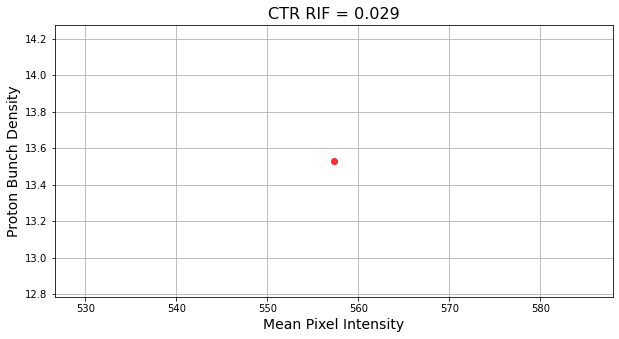

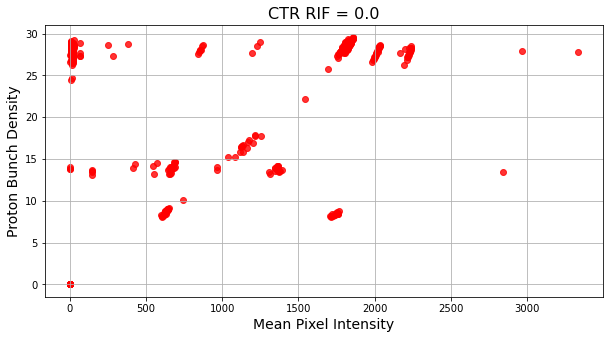

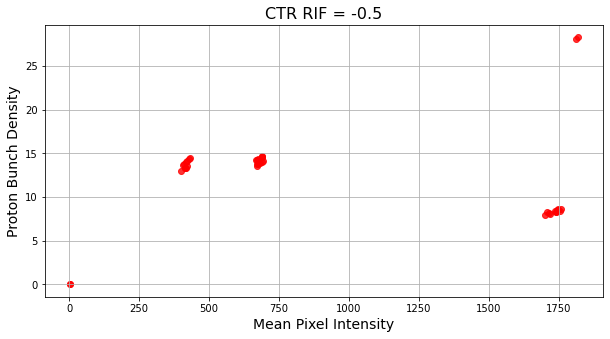

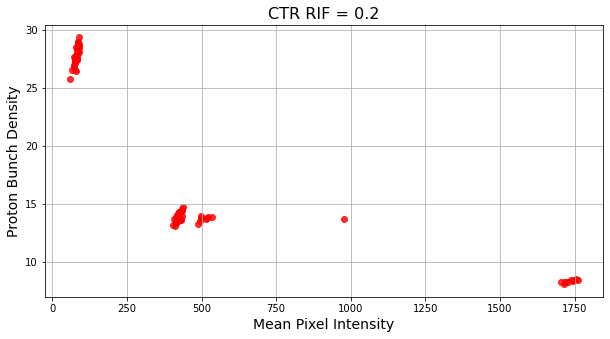

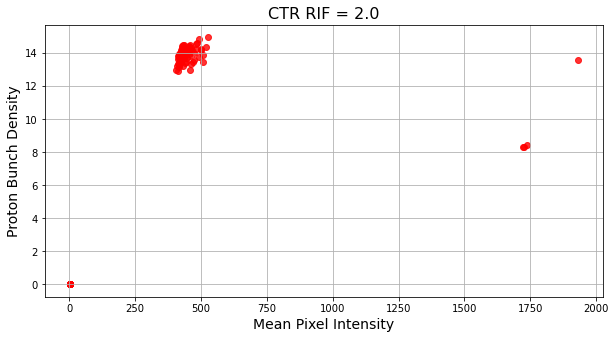

...

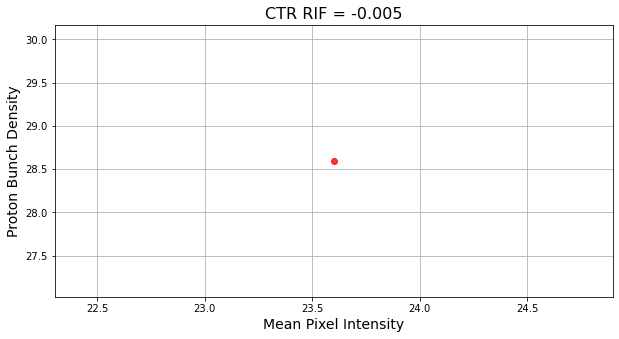

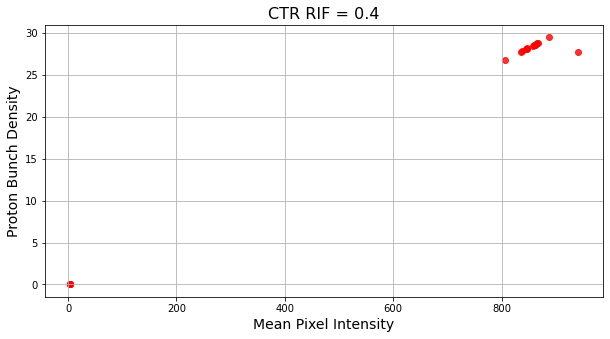

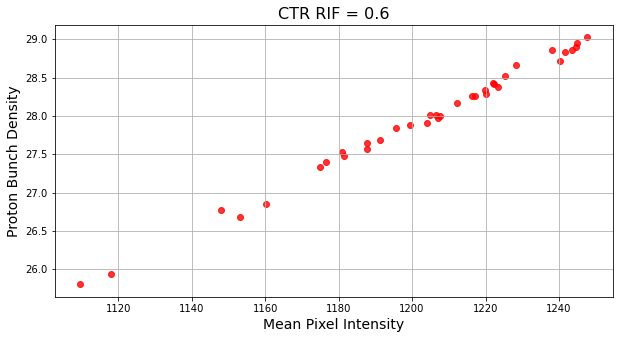

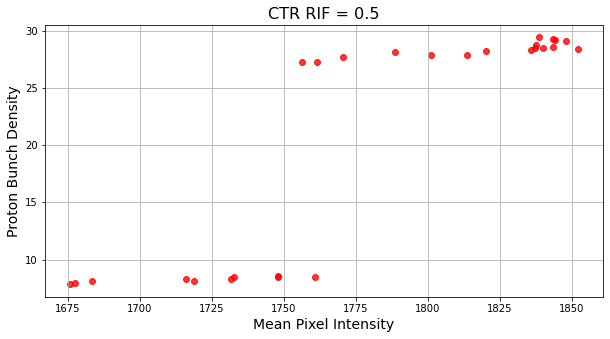

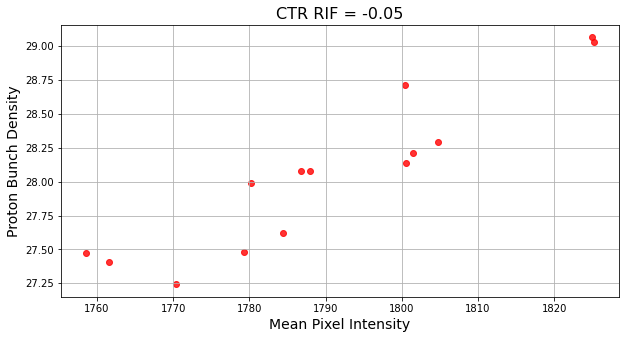

In [124]:
for rif, data in rif_data.items():
    fig, ax = plt.subplots(figsize=(10, 5))  # Create a new figure for each RIF
    
    for i in np.arange(0,len(data['LDBP_screen']),1):
        if data['CTR_screen'][i] == True:
            sc = ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color='r', alpha=0.8)
            
        if data['CTR_screen'][i] == False:
            sc = ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color='g', alpha=0.8)
    
    ax.set_title(f'CTR RIF = {round(rif-1121740.74,4)}', fontsize=16)
    ax.set_xlabel('Mean Pixel Intensity', fontsize=14)
    ax.set_ylabel('Proton Bunch Density', fontsize=14)
    ax.grid()

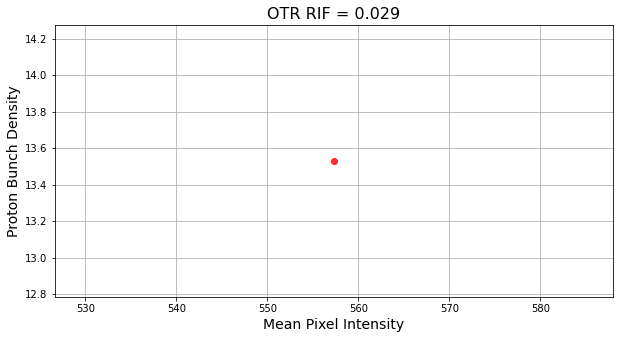

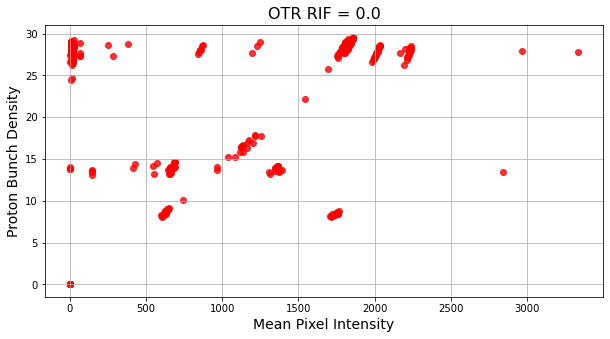

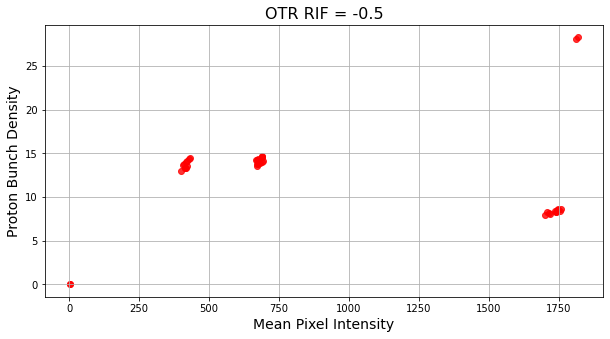

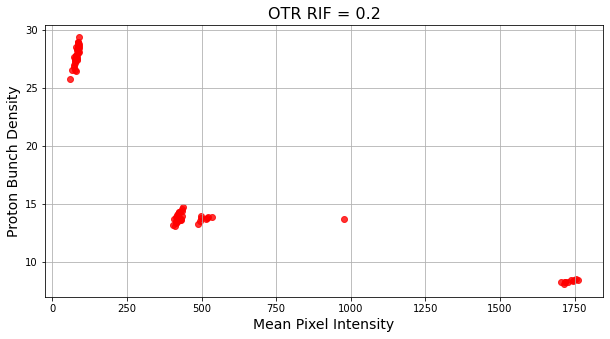

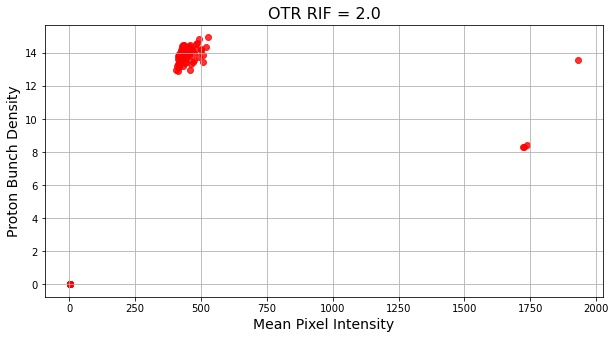

...

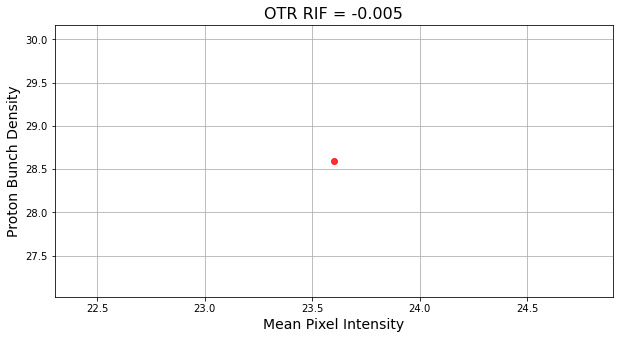

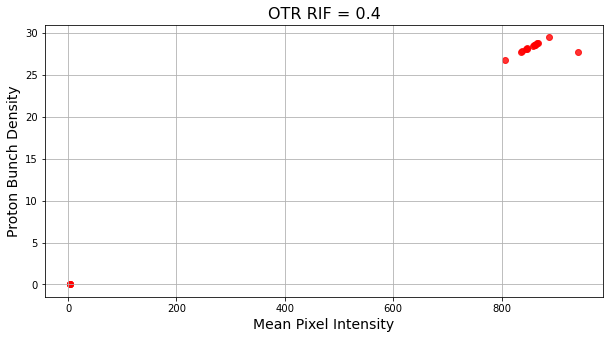

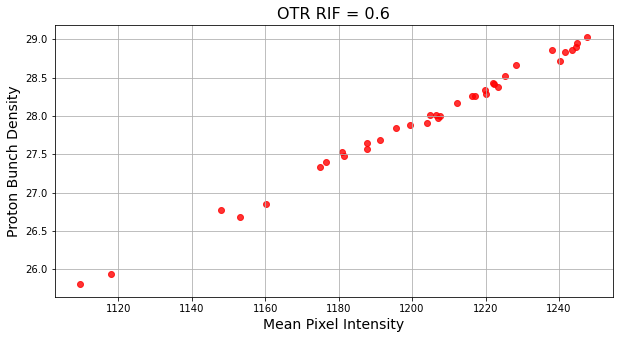

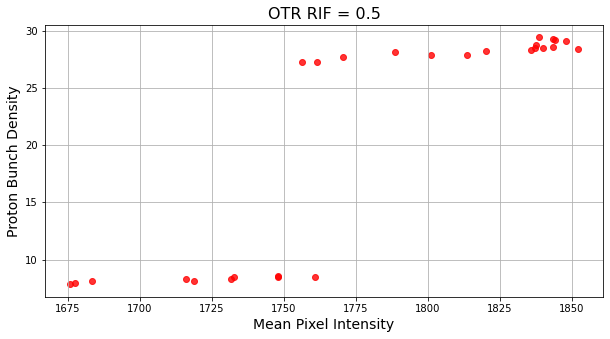

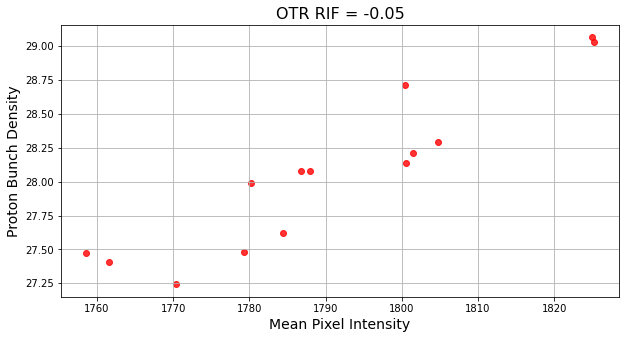

In [125]:
for rif, data in rif_data.items():
    fig, ax = plt.subplots(figsize=(10, 5))  # Create a new figure for each RIF
    
    for i in np.arange(0,len(data['LDBP_screen']),1):
        if data['OTR_screen'][i] == True:
            sc = ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color='r', alpha=0.8)
            
        if data['OTR_screen'][i] == False:
            sc = ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color='g', alpha=0.8)
    
    ax.set_title(f'OTR RIF = {round(rif-1121740.74,4)}', fontsize=16)
    ax.set_xlabel('Mean Pixel Intensity', fontsize=14)
    ax.set_ylabel('Proton Bunch Density', fontsize=14)
    ax.grid()

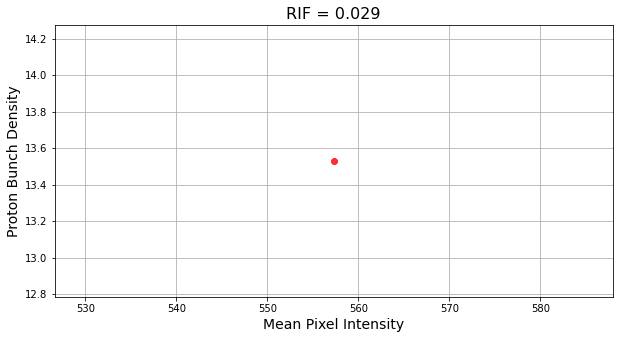

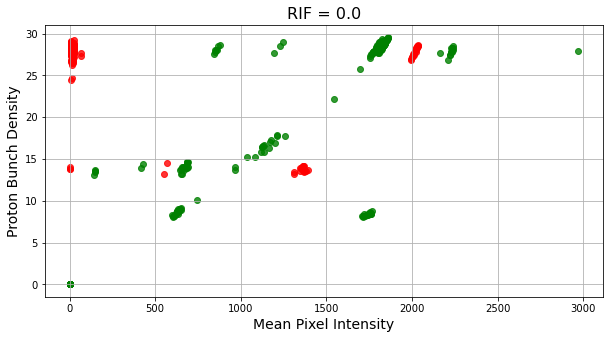

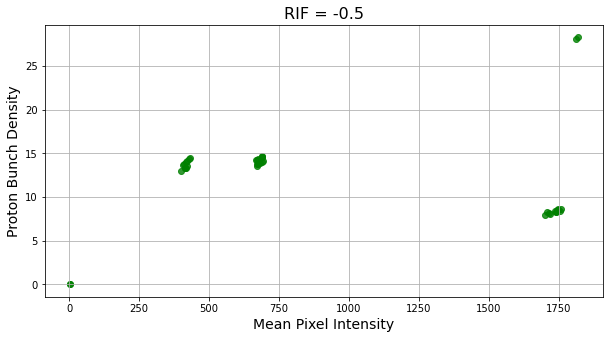

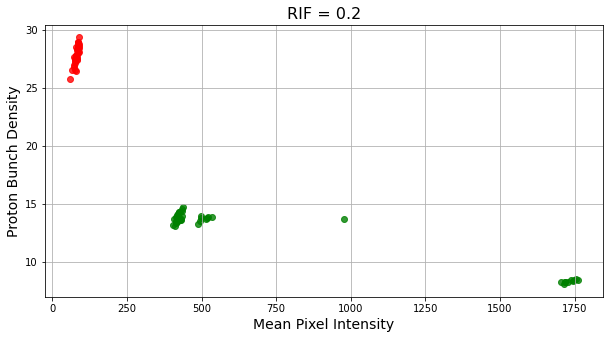

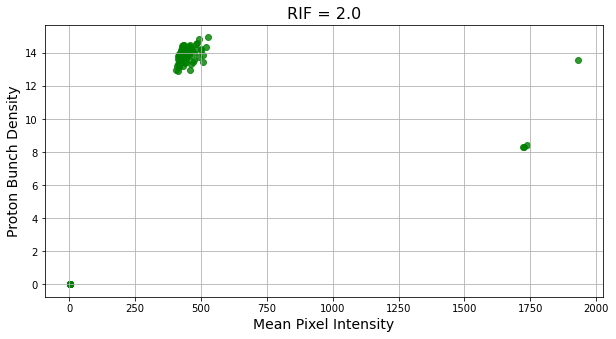

...

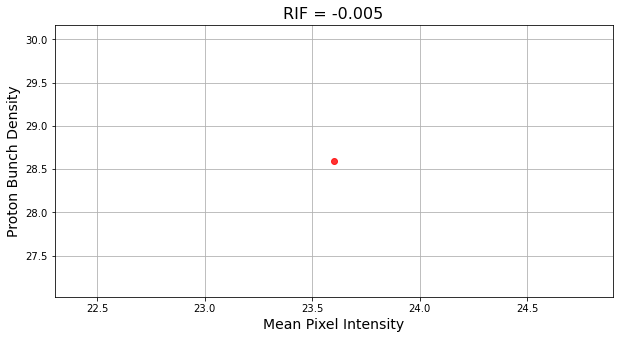

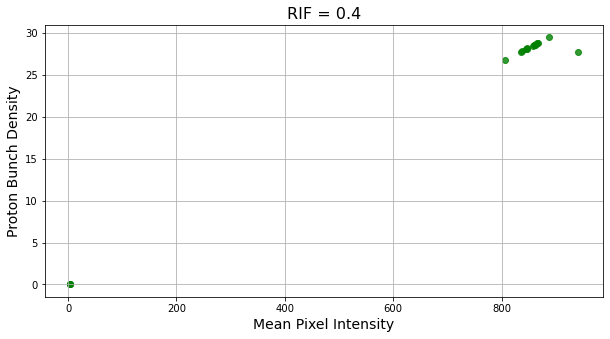

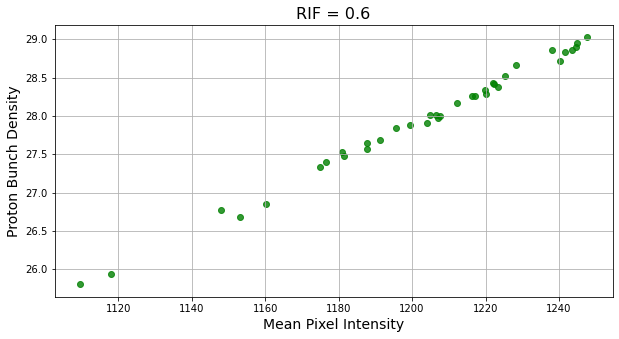

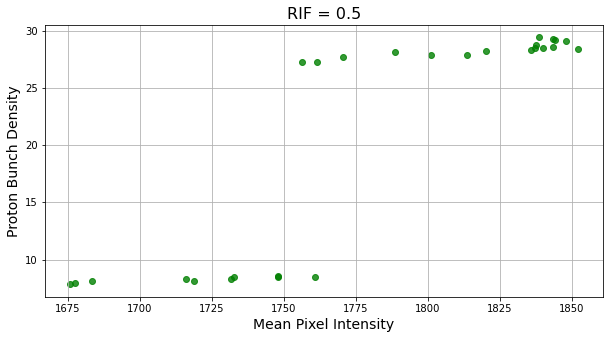

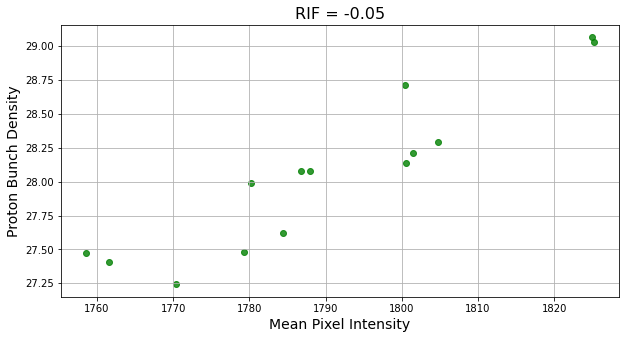

In [123]:
LDBP_screen_out_fp= []
LDBP_screen_out_pc = []
LDBP_screen_in_fp = []
LDBP_screen_in_pc = []

## screen in = green
## screen out = red
    
for rif, data in rif_data.items():
    fig, ax = plt.subplots(figsize=(10, 5))  # Create a new figure for each RIF
    
    for i in np.arange(0,len(data['LDBP_screen']),1):
        if data['LDBP_screen'][i] == 0:
            sc = ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color='g', alpha=0.8)
            if round(rif-1121740.74,4) == 0.1:
                LDBP_screen_in_fp.append(data['fit_parameters'][i])
                LDBP_screen_in_pc.append( data['proton_count'][i])
            
        if data['LDBP_screen'][i] == 2:
            sc = ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color='r', alpha=0.8)
            if round(rif-1121740.74,4) == 0.1:
                LDBP_screen_out_fp.append(data['fit_parameters'][i])
                LDBP_screen_out_pc.append( data['proton_count'][i])
    
    ax.set_title(f'RIF = {round(rif-1121740.74,4)}', fontsize=16)
    ax.set_xlabel('Mean Pixel Intensity', fontsize=14)
    ax.set_ylabel('Proton Bunch Density', fontsize=14)
    ax.grid()
    
    #plt.savefig(r'C:\Users\bethx\OneDrive\Documents\UCL_Masters\Research_Project\powerpoint_rif_04_05'{round(rif-1121740.74,4)}'.png')
    plt.show()  # Show each plot separately

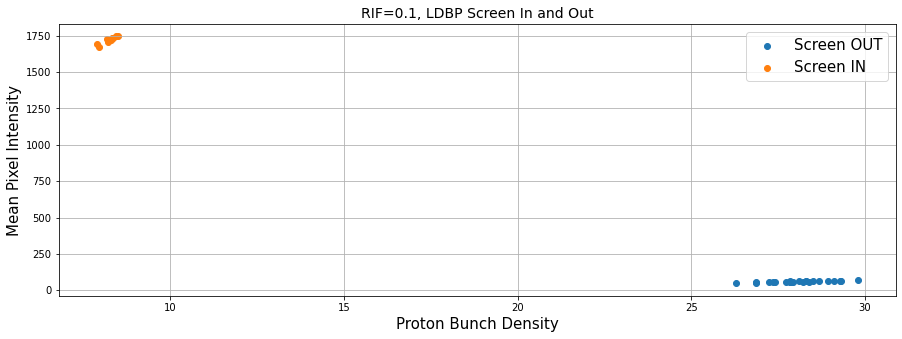

In [49]:
plt.figure(figsize=(15,5))
plt.scatter(LDBP_screen_out_pc,LDBP_screen_out_fp,label='Screen OUT')
plt.scatter(LDBP_screen_in_pc,LDBP_screen_in_fp,label='Screen IN')

plt.title('RIF=0.1, LDBP Screen In and Out',fontsize=14)

plt.xlabel('Proton Bunch Density',fontsize=15)
plt.ylabel('Mean Pixel Intensity',fontsize=15)
plt.legend(fontsize=15)
plt.grid()

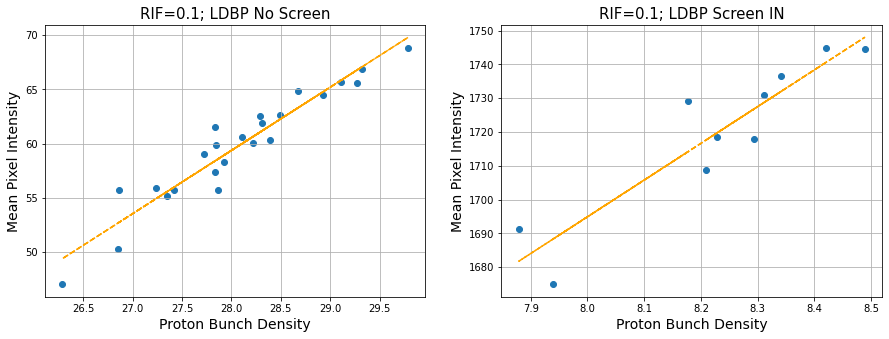

In [52]:
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(15,5))

ax1.scatter(LDBP_screen_out_pc,LDBP_screen_out_fp)
ax2.scatter(LDBP_screen_in_pc,LDBP_screen_in_fp)

a,b = np.polyfit(LDBP_screen_out_pc,LDBP_screen_out_fp,1)
c,d = np.polyfit(LDBP_screen_in_pc,LDBP_screen_in_fp,1)

ax1.plot(LDBP_screen_out_pc,a*np.array(LDBP_screen_out_pc)+b,'--',color='orange')
ax2.plot(LDBP_screen_in_pc,c*np.array(LDBP_screen_in_pc)+d,'--',color='orange')

ax1.set_title('RIF=0.1; LDBP No Screen',fontsize=15)
ax2.set_title('RIF=0.1; LDBP Screen IN',fontsize=15)

ax1.set_ylabel('Mean Pixel Intensity', fontsize=14)
ax1.set_xlabel('Proton Bunch Density', fontsize=14)

ax2.set_ylabel('Mean Pixel Intensity', fontsize=14)
ax2.set_xlabel('Proton Bunch Density', fontsize=14)

ax1.grid()
ax2.grid()

In [ ]:
## Code to sort screens for 

In [9]:
## Code to sort screens for one RIF

files = os.listdir('/eos/experiment/awake/event_data/'+'2024/10/08')

rif_data = {}
rif_data[rif] = {'fit_parameters': [], 'proton_count': [],'density': []}

for i in np.arange(0,10,1):
    
    files,data,protons,rif,density = load_data(i,1)
    bg_sensor = subtract_sensor('2024/10/08',i,1,3.78126279)
    w_median_filter = ski.filters.median(bg_sensor, footprint=disk(4)) 
    
    if rif == 1121740.74:
        
        # Store values for the corresponding RIF
        rif_data[1121740.74]['fit_parameters'].append(np.mean(w_median_filter))
        rif_data[1121740.74]['proton_count'].append(protons)
        rif_data[1121740.74]['density'].append(density)

# Test some Funny Screens

## BTV426

In [108]:
max_count = 0

for i in np.arange(0,len(files),1):
    
    f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[i],'r')
    BTV426 = f['AwakeEventData']['TT41.BTV.412426.DigiCam']['ExtractionImage']['image2D'][:]

    total_count = np.sum(BTV426)
    if total_count > max_count:
        max_count = total_count
        max_i = i

38990735 0
40062579 1
56317720 66
56839163 67
68816222 69
192667121 176
203272678 178
270049464 192
271309218 193
276940741 194
279626569 198
303858071 206
304735066 207
308204603 209
308798738 210


In [133]:
f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[210],'r')
BTV426 = f['AwakeEventData']['TT41.BTV.412426.DigiCam']['ExtractionImage']['image2D'][:]

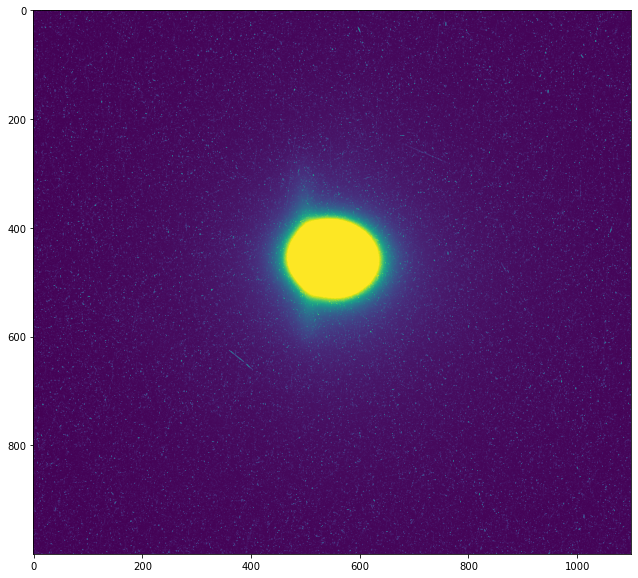

In [134]:
plt.figure(figsize=(15,10))
plt.imshow(BTV426)

## BTV50

In [128]:
max_count = 0

for i in np.arange(0,len(files),1):
    
    f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[i],'r')
    BTV50 = f['AwakeEventData']['TT41.BTV.412350.DigiCam']['ExtractionImage']['image2D'][:]

    total_count = np.sum(BTV50)
    if total_count > max_count:
        max_count = total_count
        max_i = i
        
        print(max_i,max_count)

0 684335
1 696997
2 711470
42 733622
117 802345
192 850858
196 856254
198 879433
200 915223
201 942144
203 980622
207 1022805
597 1140197


In [139]:
f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[597],'r')
BTV50 = f['AwakeEventData']['TT41.BTV.412350.DigiCam']['ExtractionImage']['image2D'][:]

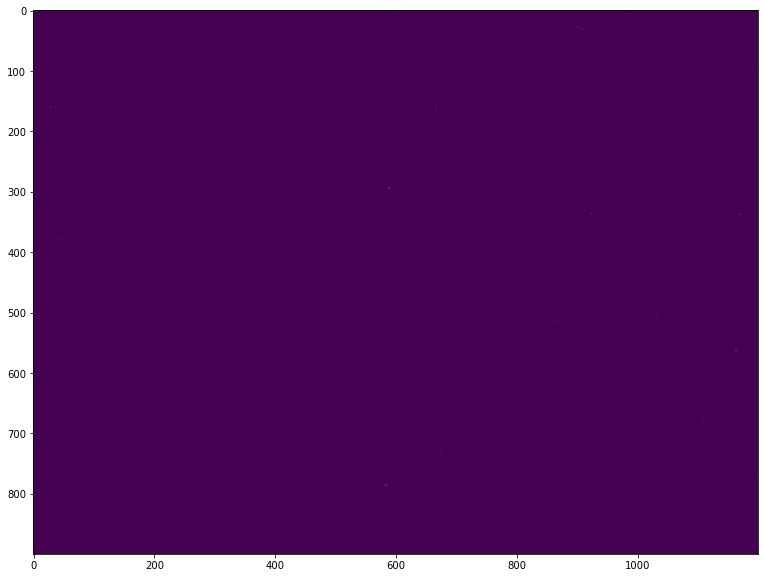

In [140]:
plt.figure(figsize=(15,10))
plt.imshow(BTV50)

## BTV53

In [129]:
max_count = 0

for i in np.arange(0,len(files),1):
    
    f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[i],'r')
    BTV53 = f['AwakeEventData']['TT41.BTV.412353.DigiCam']['ExtractionImage']['image2D'][:]

    total_count = np.sum(BTV53)
    if total_count > max_count:
        max_count = total_count
        max_i = i
        
        print(max_i,max_count)

0 147850
1 753020
2 769590
117 779751
176 240386043
177 272420082
179 292295432


In [144]:
f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[179],'r')
BTV53 = f['AwakeEventData']['TT41.BTV.412353.DigiCam']['ExtractionImage']['image2D'][:]

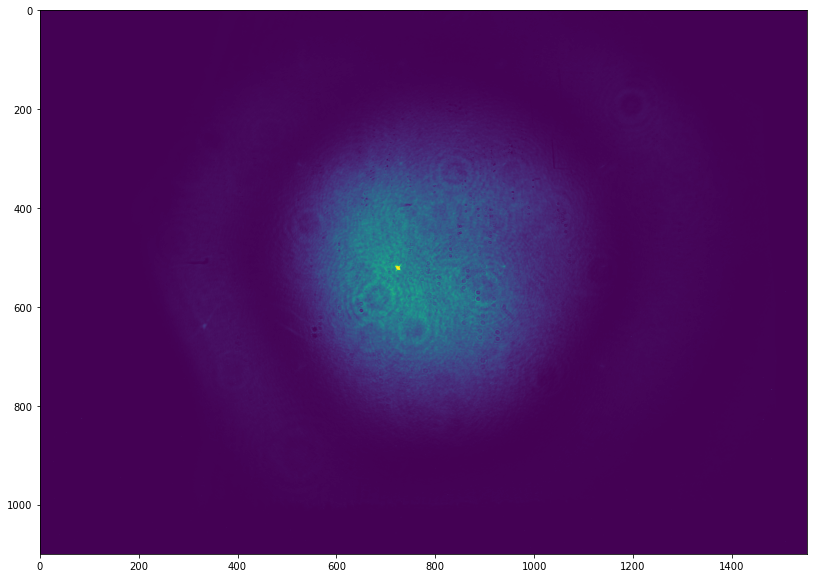

In [145]:
plt.figure(figsize=(15,10))
plt.imshow(BTV53)

## BTV54

In [130]:
max_count = 0

for i in np.arange(0,len(files),1):
    
    f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[i],'r')
    BTV54 = f['AwakeEventData']['TT41.BTV.412354.DigiCam']['ExtractionImage']['image2D'][:]

    total_count = np.sum(BTV54)
    if total_count > max_count:
        max_count = total_count
        max_i = i
        
        print(max_i,max_count)

0 121861194
1 128923602
177 134682248
206 160834552
207 163387206
210 165952434


In [148]:
f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[207],'r')
BTV54 = f['AwakeEventData']['TT41.BTV.412354.DigiCam']['ExtractionImage']['image2D'][:]

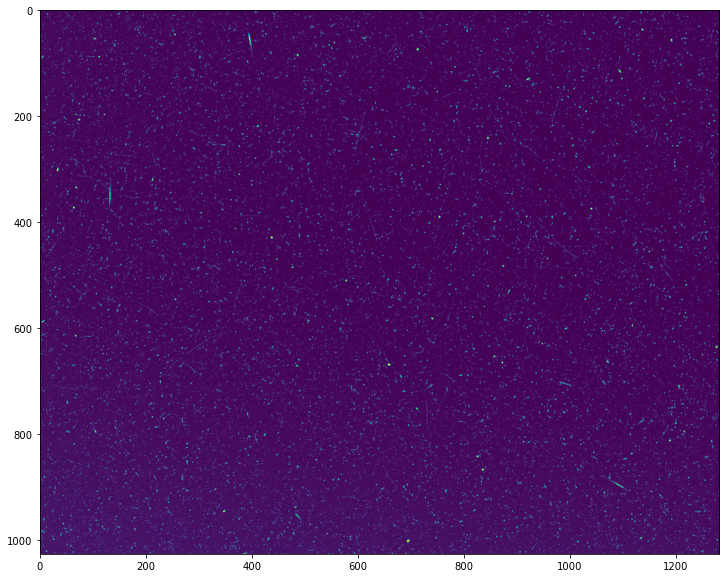

In [149]:
plt.figure(figsize=(15,10))
plt.imshow(BTV54)

## Exp Vol

In [150]:
max_count = 0

for i in np.arange(0,len(files),1):
    
    f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[i],'r')
    EV = f['AwakeEventData']['TT41.BTV.412354.EXPVOL1.DigiCam']['ExtractionImage']['image2D'][:]

    total_count = np.sum(EV)
    if total_count > max_count:
        max_count = total_count
        max_i = i
        
        print(max_i,max_count)

0 3382786
1 3407376
26 4563211
36 4710854
41 4844171
46 4898806
54 5063741
224 5641535
234 5839511
235 5867261
245 5970583
251 7856806
254 8605898
255 9102633
279 9291471
312 9354601
315 9636548


In [153]:
f = h5py.File('/eos/experiment/awake/event_data/2024/10/08/'+files[315],'r')
EV = f['AwakeEventData']['TT41.BTV.412354.EXPVOL1.DigiCam']['ExtractionImage']['image2D'][:]

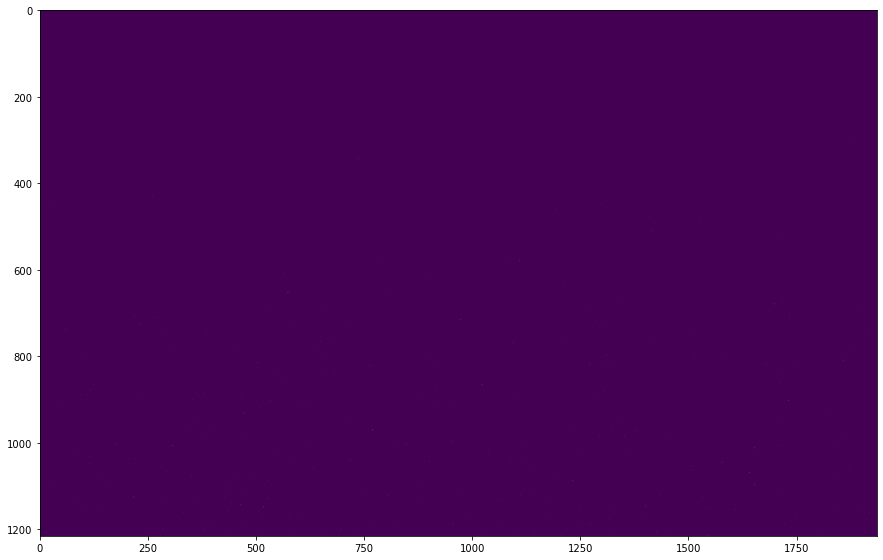

In [154]:
plt.figure(figsize=(15,10))
plt.imshow(EV)

# 2. Functionalise for diff dates

In [185]:
os.listdir('/eos/experiment/awake/event_data/2024/09')

['01',
 '02',
 '03',
 '05',
 '06',
 '07',
 '08',
 '09',
 '10',
 '13',
 '14',
 '15',
 '17',
 '23',
 '30']

In [22]:
# vary date function
def check_screen_count(date,screen):
    
    files = os.listdir('/eos/experiment/awake/event_data/'+date)
    max_count = 0

    for i in np.arange(0,len(files),1):
        
        try:
            f = h5py.File('/eos/experiment/awake/event_data/'+date+'/'+files[i],'r')
            screen_of_interest = f['AwakeEventData'][screen]['ExtractionImage']['image2D'][:]

            total_count = np.sum(screen_of_interest)
            if total_count > max_count:
                max_count = total_count
                max_i = i

                print(max_i,max_count)    
                
        except Exception as error :
            print("An exception occurred:", type(error).__name__)    
            print(i)
    
    f_fin = h5py.File('/eos/experiment/awake/event_data/'+date+'/'+files[max_i],'r')
    EV = f_fin['AwakeEventData'][screen]['ExtractionImage']['image2D'][:]
    
    plt.figure(figsize=(15,10))
    plt.imshow(EV)
    
    return max_i, max_count

0 147850
1 753020
2 769590
117 779751
176 240386043
177 272420082
179 292295432


(179, 292295432)

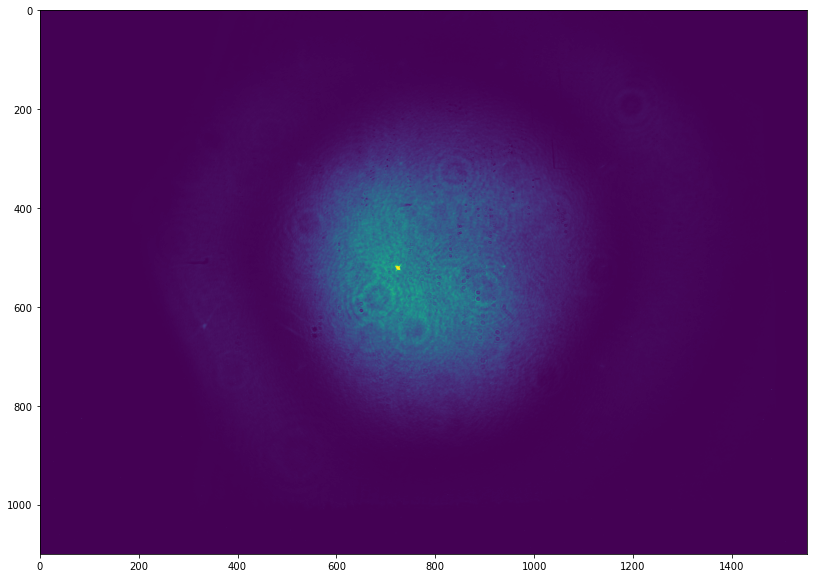

In [169]:
check_screen_count('2024/10/08','TT41.BTV.412353.DigiCam')

0 3382786
1 3407376
26 4563211
36 4710854
41 4844171
46 4898806
54 5063741
224 5641535
234 5839511
235 5867261
245 5970583
251 7856806
254 8605898
255 9102633
279 9291471
312 9354601
315 9636548


(315, 9636548)

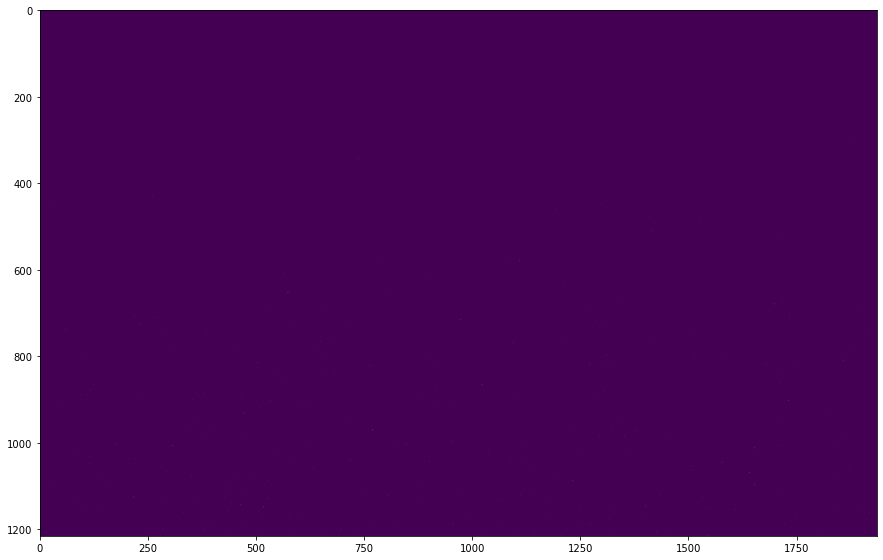

In [170]:
check_screen_count('2024/10/08','TT41.BTV.412354.EXPVOL1.DigiCam')

## Try some different dates?

0 2987964
1 2994773
2 3004565
6 3618727
7 3688141
8 3692643
9 3696083
10 3706401
172 3788996
173 3897843
177 3928761
178 3954830
179 4052429
181 4055152
187 4104042
188 4280223
232 4333654
245 4364402
246 4465443
461 4471746
463 4474210
464 4597837


(464, 4597837)

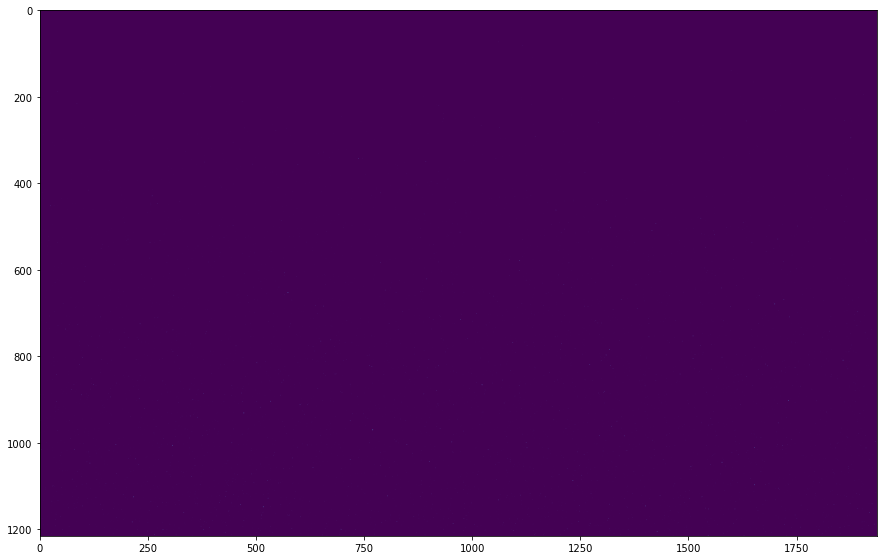

In [171]:
check_screen_count('2024/10/07','TT41.BTV.412354.EXPVOL1.DigiCam')

0 96310052
1 102527076
2 102775812
5 102930368
6 143891634
7 148458392
13 154304412
21 154459952
59 156764676
63 157613650
76 164931402
358 165202506


(358, 165202506)

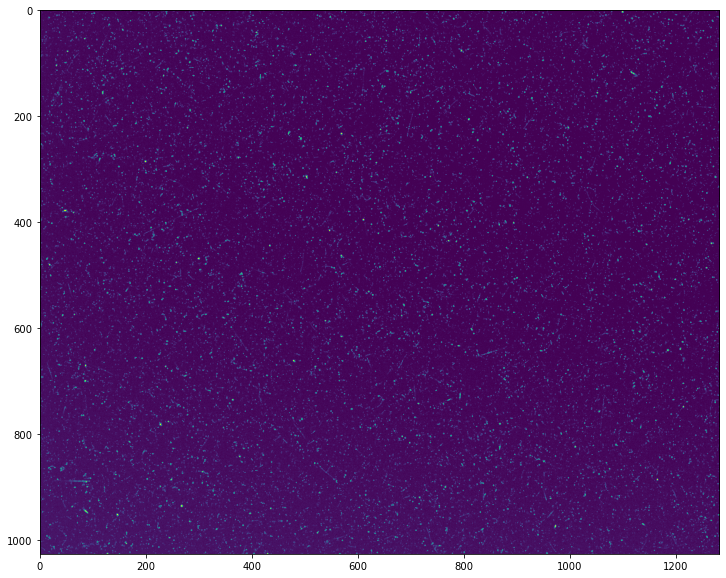

In [172]:
check_screen_count('2024/10/07','TT41.BTV.412354.DigiCam')

In [5]:
list_screens = ['TT41.BTV.412354.EXPVOL1.DigiCam','TT41.BTV.412354.DigiCam','TT41.BTV.412353.DigiCam','TT41.BTV.412350.DigiCam','TT41.BTV.412426.DigiCam']

0 144256
1 145884
4 146803
6 1161660
10 1187999
11 1336354
58 6217770
60 6258424
61 290154176
79 298319904
360 304849321
361 308164613
0 283814
1 290493
6 740815
8 769803
12 798387
345 916172
357 941038
358 1030062
376 1166461
389 1192268
0 8984744
1 9037845
6 119142077
7 125517294
8 127830462
10 129445851
58 376883207
59 381204568
60 391428059
102 401151672
104 407275452
106 415007394
172 513199475
178 522320996
182 527620135


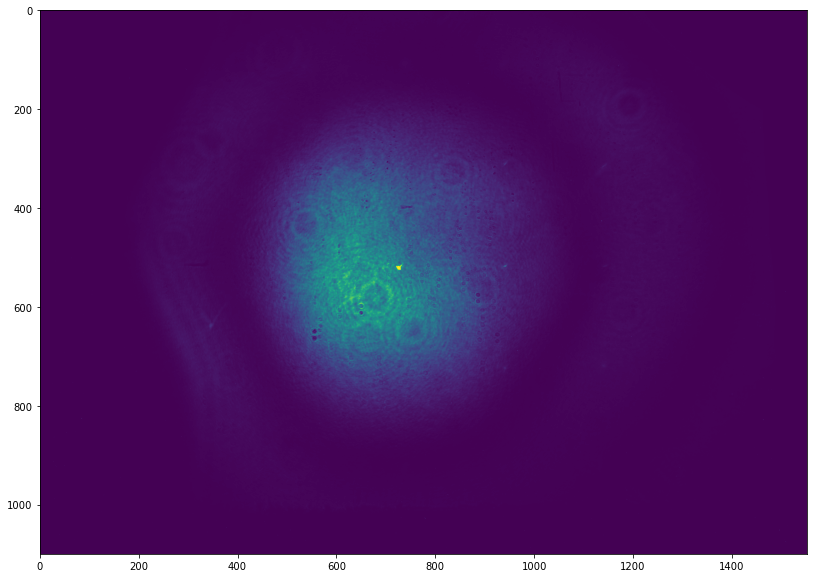

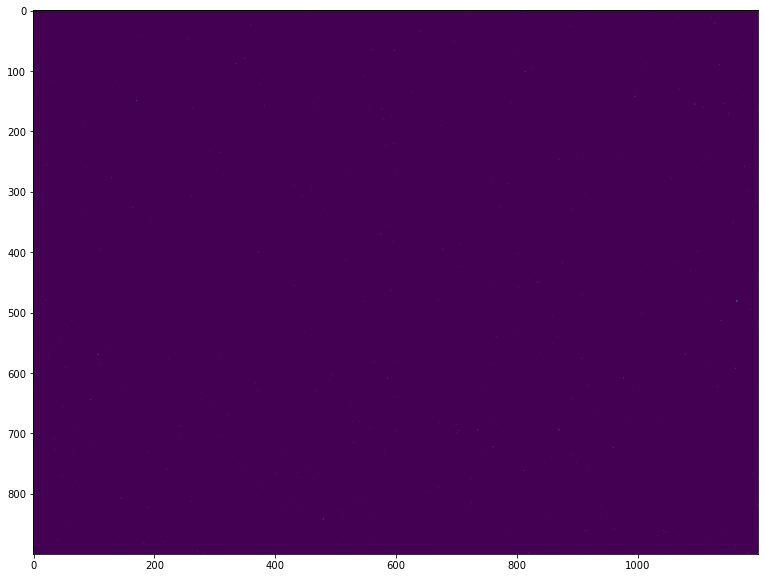

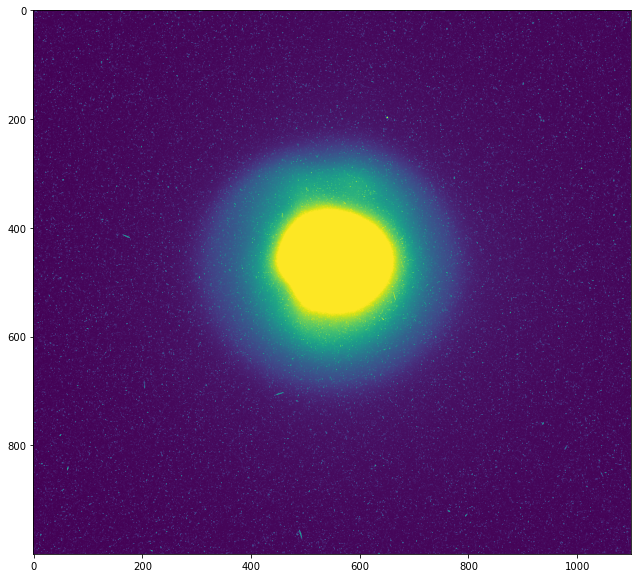

In [177]:
for n in np.arange(0,len(list_screens),1):
    
    check_screen_count('2024/10/07', list_screens[n])

0 3074273
1 3080267
2 3082624
3 3084969
5 3095423
7 3105803
41 3105891
42 3108086
44 3788687
45 3815458
46 3855078
76 3864679
198 5127131
204 5259805
209 5394657
223 6247789
224 6309513
225 6519939
227 7025987
231 7209221
274 7281704
329 7422270
362 7429823
363 7437026
0 153730292
1 156638568
2 157624874
12 164627050
30 168739806
44 218745820
0 146390
2 147734
3 147772
6 150315
44 1230881
45 1267314
62 1281949
122 312326170
125 315337288
126 317285638
152 322142492
154 323581828
155 325178803
0 292775
1 293652
5 296062
30 296156
44 819842
46 846133
59 869767
1116 916949
1124 925304
1133 968950
1134 1002038
1140 1012940
1146 1027984
0 37073789
1 37182504
5 37258551
14 37285246
44 445874183
45 449599598
47 451099638
59 462287148
62 469739782
73 603752526
75 607548833
77 608447573


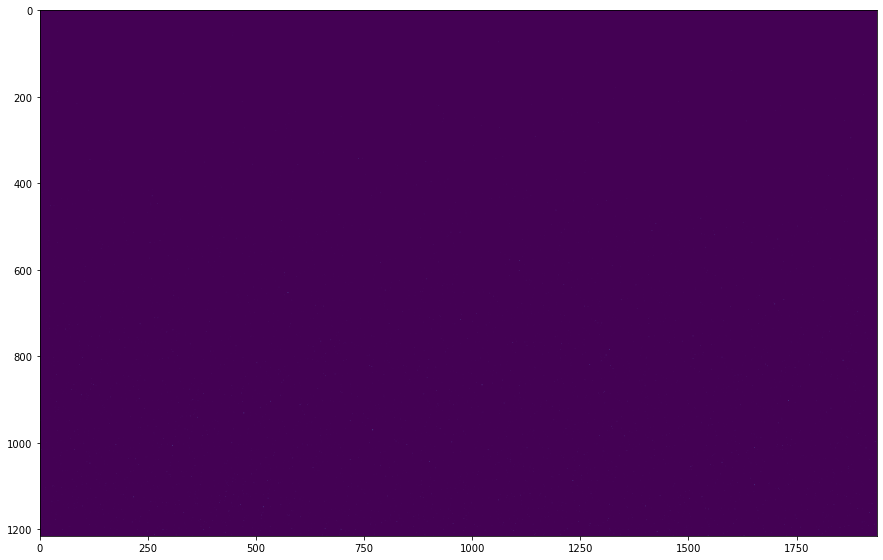

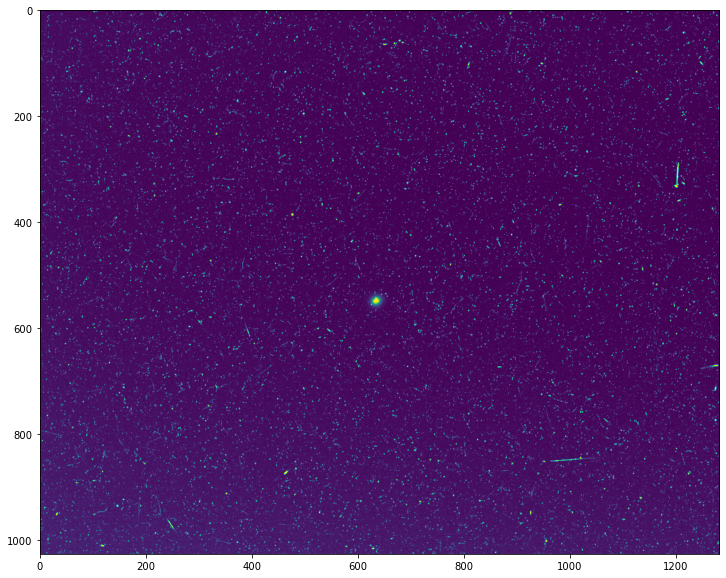

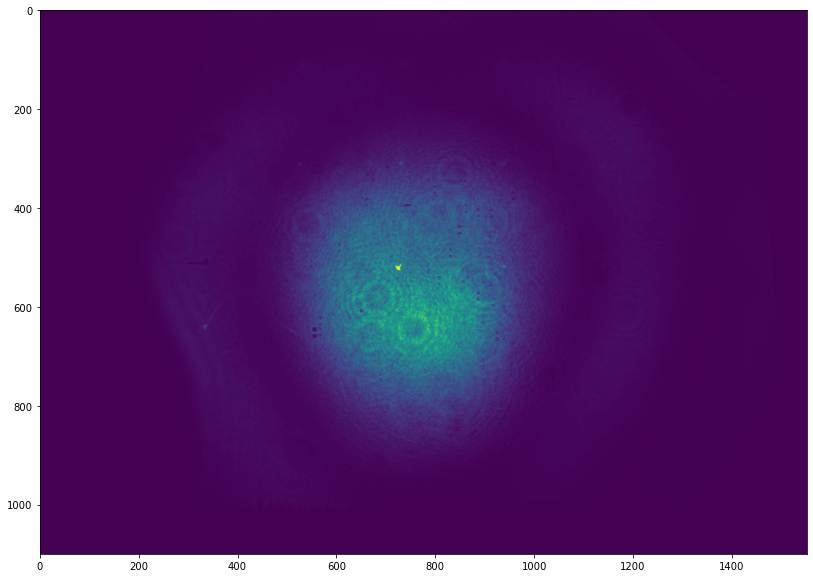

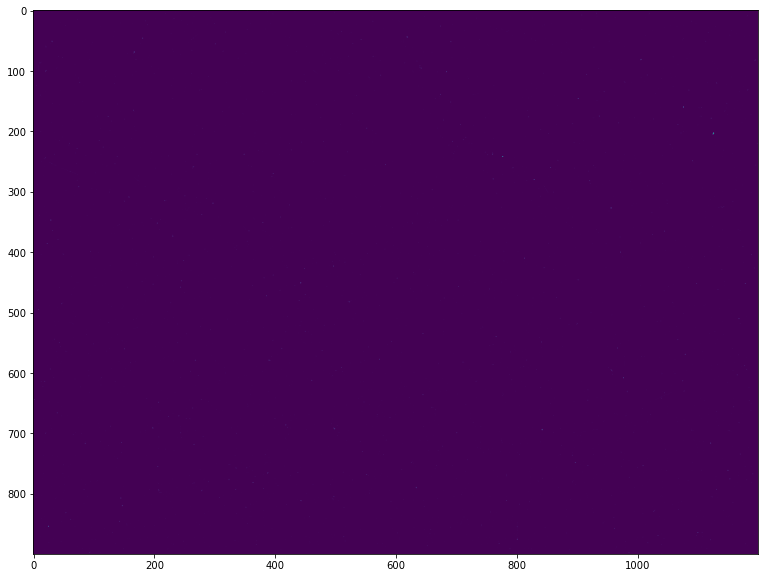

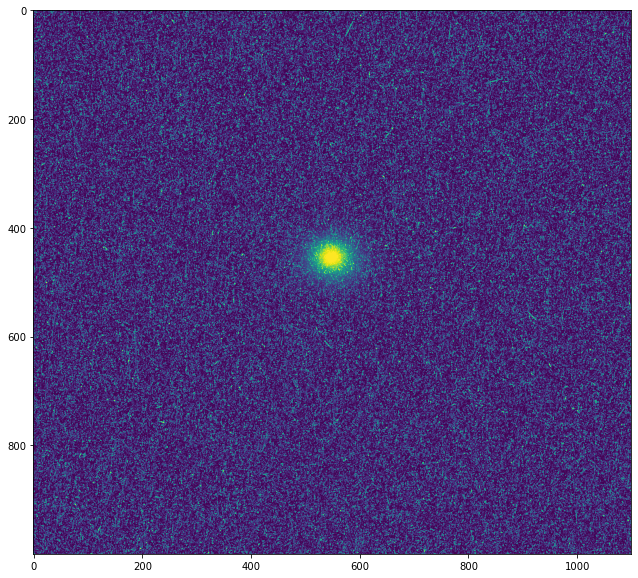

In [179]:
for n in np.arange(0,len(list_screens),1):
    
    check_screen_count('2024/10/06', list_screens[n])

0 3067363
3 3273385
4 3291043
7 3295262
12 3303951
16 3317481
21 3396183
22 3408735
23 3409570
24 3434999
0 103770376
2 103934290
3 117303526
4 171853302
5 179818814
7 180533220
9 188371536
55 191343642
88 191888212
0 152436
3 666306
4 713007
18 737692
24 776356
52 314960223
53 325734367
0 294571
3 318424
5 321530
7 321784
8 323054
9 327567
14 328081
21 342238
24 346017
0 9611553
2 9620686
3 171967282
4 186604799
5 187182084
7 187763294
9 188646633
12 189154553
21 218131658
102 781288743


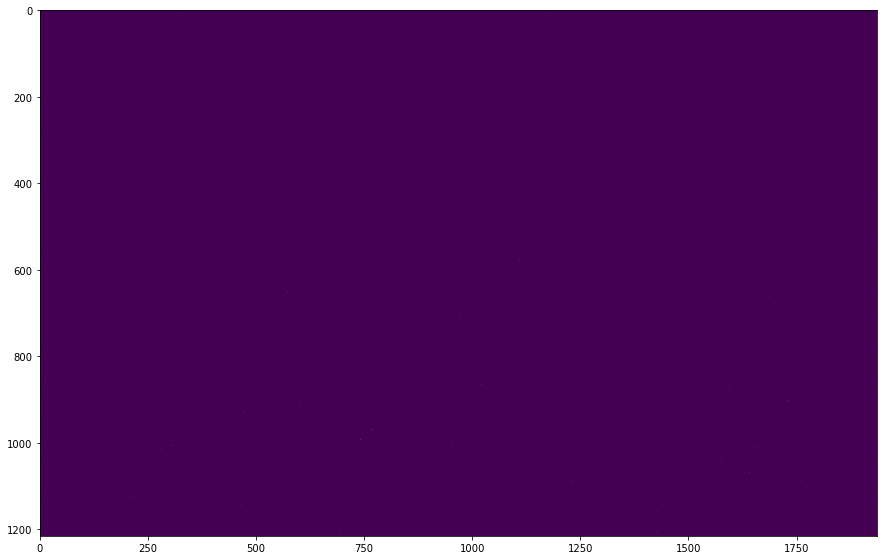

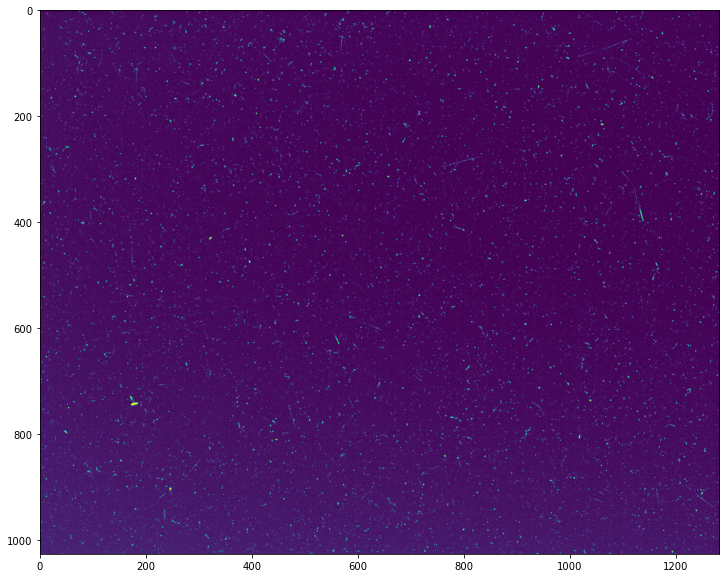

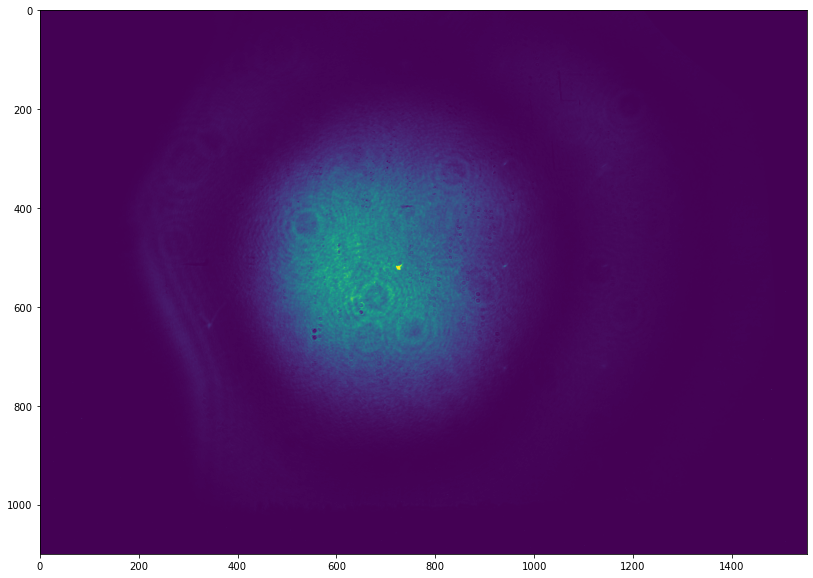

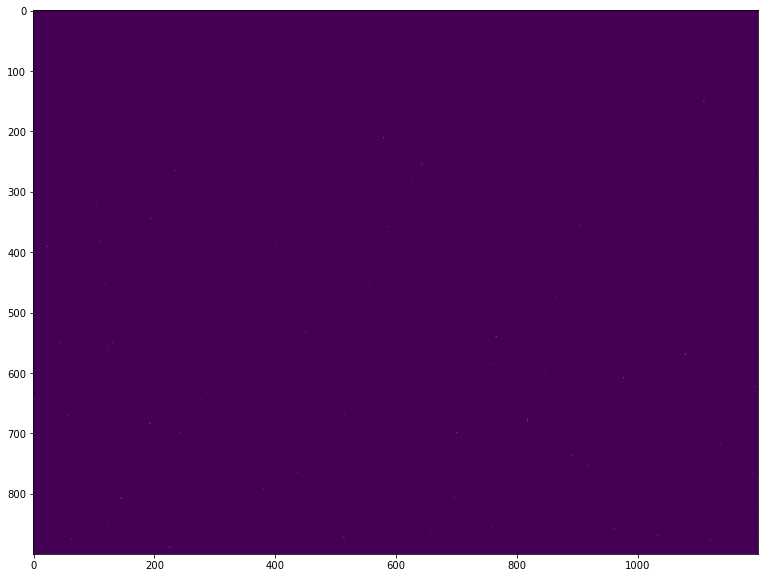

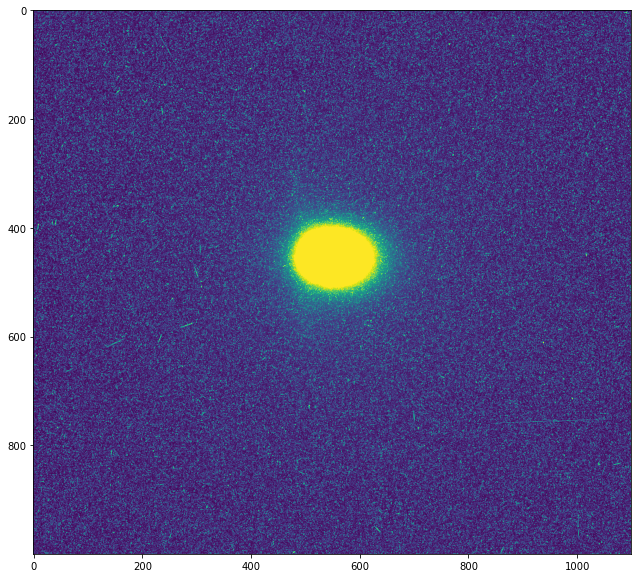

In [180]:
for n in np.arange(0,len(list_screens),1):
    
    check_screen_count('2024/10/14', list_screens[n])

In [7]:
for n in np.arange(0,len(list_screens),1):
    
    try:
        check_screen_count('2024/09/05', list_screens[n])
        
    except Exception as error :
        print("An exception occurred:", type(error).__name__)

0 2690846
26 2695576
35 2698579
48 2701303
50 2702384
53 2705117
65 2726710
67 2727242
71 3091825
83 3108001
89 36353038
91 36403857
93 36630555
94 36758809
122 275556443
322 958009064
329 1161324201
367 1164111715
370 1164298612
405 1202427067
510 1466640797
An exception occurred: KeyError
0 59892972
23 63752362
28 63987784
29 64232260
37 64252962
39 64708358
67 66663252
89 96981872
90 99898450
92 101623606
93 102094106
122 112325196
193 326452070
194 328339544
An exception occurred: KeyError
0 128824
1 811255
60 294420672
62 303983056
645 3533069948
An exception occurred: KeyError
0 217153
1 728843
442 813288
An exception occurred: KeyError
0 5692813
1 35130407
71 217539509
83 226636898
84 227544684
85 228936258
89 255360968
91 256116329
93 257660720
94 258088985
122 510461544
123 512354369
128 513914337
134 515714805
An exception occurred: KeyError


In [ ]:
['TT41.BTV.412354.EXPVOL1.DigiCam','TT41.BTV.412354.DigiCam','TT41.BTV.412353.DigiCam','TT41.BTV.412350.DigiCam','TT41.BTV.412426.DigiCam']

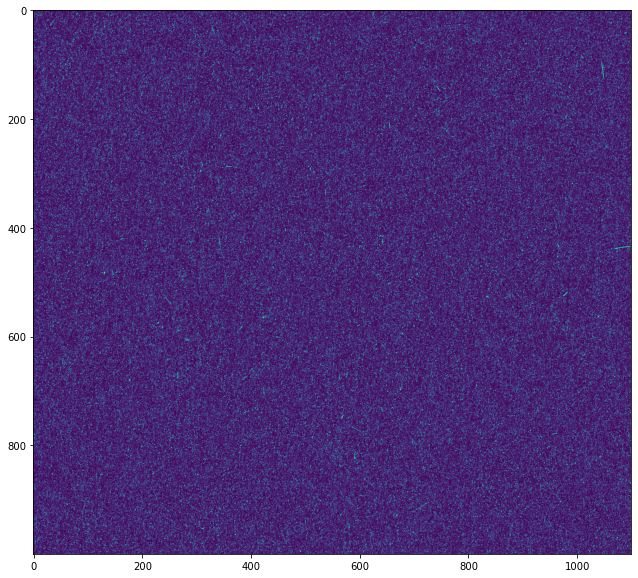

In [15]:
## 426

files = os.listdir('/eos/experiment/awake/event_data/2024/09/05')
f_t = h5py.File('/eos/experiment/awake/event_data/2024/09/05/'+files[134],'r')
EV1 = f_t['AwakeEventData']['TT41.BTV.412426.DigiCam']['ExtractionImage']['image2D'][:]
    
plt.figure(figsize=(15,10))
plt.imshow(EV1)

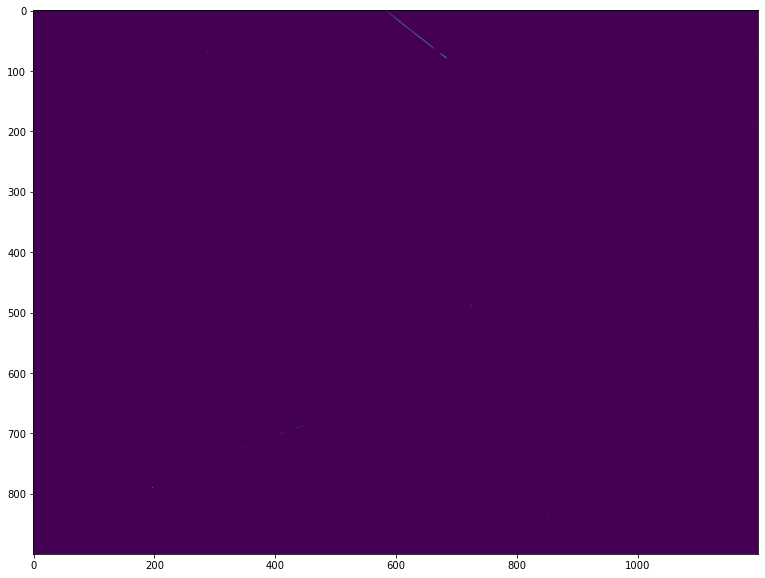

In [14]:
## 50

files = os.listdir('/eos/experiment/awake/event_data/2024/09/05')
f_t = h5py.File('/eos/experiment/awake/event_data/2024/09/05/'+files[442],'r')
EV1 = f_t['AwakeEventData']['TT41.BTV.412350.DigiCam']['ExtractionImage']['image2D'][:]
    
plt.figure(figsize=(15,10))
plt.imshow(EV1)

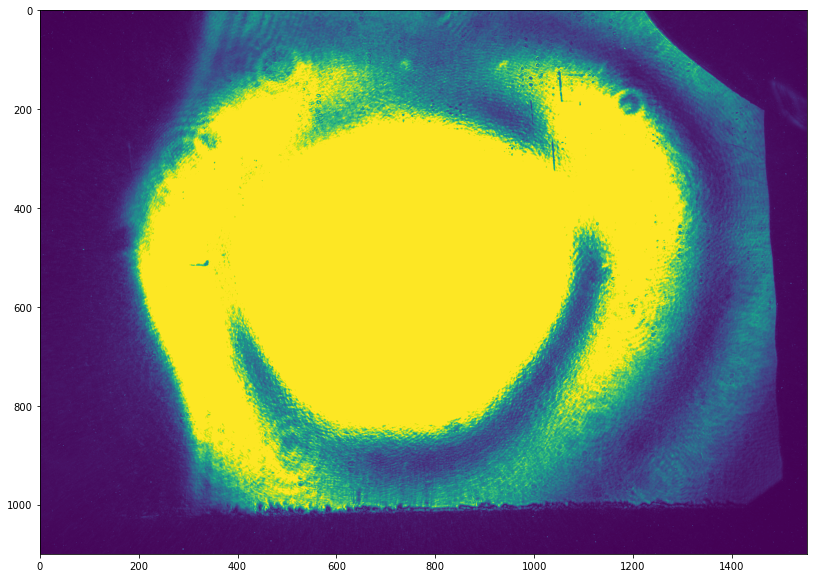

In [13]:
## 53

files = os.listdir('/eos/experiment/awake/event_data/2024/09/05')
f_t = h5py.File('/eos/experiment/awake/event_data/2024/09/05/'+files[645],'r')
EV1 = f_t['AwakeEventData']['TT41.BTV.412353.DigiCam']['ExtractionImage']['image2D'][:]
    
plt.figure(figsize=(15,10))
plt.imshow(EV1)

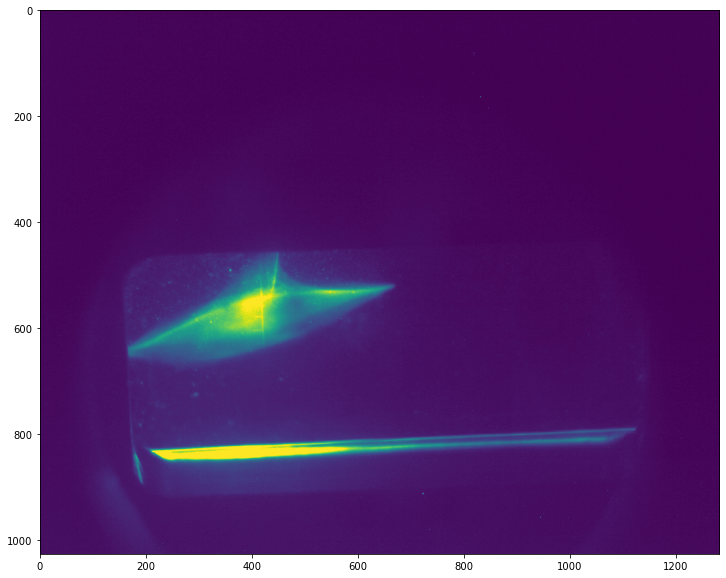

In [12]:
## 54

files = os.listdir('/eos/experiment/awake/event_data/2024/09/05')
f_t = h5py.File('/eos/experiment/awake/event_data/2024/09/05/'+files[194],'r')
EV1 = f_t['AwakeEventData']['TT41.BTV.412354.DigiCam']['ExtractionImage']['image2D'][:]
    
plt.figure(figsize=(15,10))
plt.imshow(EV1)

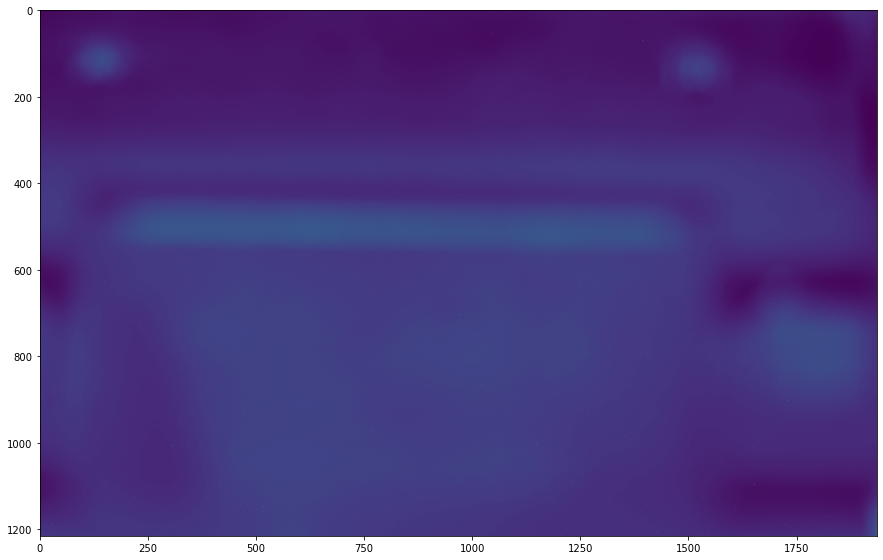

In [11]:
## EXT VOL

files = os.listdir('/eos/experiment/awake/event_data/2024/09/05')
f_t = h5py.File('/eos/experiment/awake/event_data/2024/09/05/'+files[510],'r')
EV1 = f_t['AwakeEventData']['TT41.BTV.412354.EXPVOL1.DigiCam']['ExtractionImage']['image2D'][:]
    
plt.figure(figsize=(15,10))
plt.imshow(EV1)

0 2819329
1 2824587
3 2831505
15 2867275
29 33546864
30 34319290
90 34983007
121 35084016
145 61862493
149 63135362
171 1198048293
173 1214941592
334 1465257154
491 1472314939
An exception occurred: KeyError
727
An exception occurred: KeyError
728
An exception occurred: KeyError
729
An exception occurred: KeyError
730
An exception occurred: KeyError
731
An exception occurred: KeyError
732
An exception occurred: KeyError
733
An exception occurred: KeyError
734
An exception occurred: KeyError
735
An exception occurred: KeyError
736
An exception occurred: KeyError
737
An exception occurred: KeyError
738
An exception occurred: KeyError
739
An exception occurred: KeyError
740
An exception occurred: KeyError
741
An exception occurred: KeyError
742
An exception occurred: KeyError
743
An exception occurred: KeyError
744
An exception occurred: KeyError
745
An exception occurred: KeyError
746
An exception occurred: KeyError
747
An exception occurred: KeyError
748
An exception occurred: KeyError


An exception occurred: KeyError
743
An exception occurred: KeyError
744
An exception occurred: KeyError
745
An exception occurred: KeyError
746
An exception occurred: KeyError
747
An exception occurred: KeyError
748
An exception occurred: KeyError
749
An exception occurred: KeyError
750
An exception occurred: KeyError
751
An exception occurred: KeyError
752
An exception occurred: KeyError
753
An exception occurred: KeyError
754
An exception occurred: KeyError
755
An exception occurred: KeyError
756
An exception occurred: KeyError
757
An exception occurred: KeyError
758
An exception occurred: KeyError
759
An exception occurred: KeyError
760
An exception occurred: KeyError
761
An exception occurred: KeyError
762
An exception occurred: KeyError
763
An exception occurred: KeyError
764
An exception occurred: KeyError
765
An exception occurred: KeyError
766
An exception occurred: KeyError
767
An exception occurred: KeyError
768
An exception occurred: KeyError
769
An exception occurred: KeyEr

An exception occurred: KeyError
785
An exception occurred: KeyError
786
An exception occurred: KeyError
787
An exception occurred: KeyError
788
An exception occurred: KeyError
789
An exception occurred: KeyError
790
An exception occurred: KeyError
791
An exception occurred: KeyError
792
An exception occurred: KeyError
793
An exception occurred: KeyError
794
An exception occurred: KeyError
795
An exception occurred: KeyError
796
An exception occurred: KeyError
797
An exception occurred: KeyError
798
An exception occurred: KeyError
799
An exception occurred: KeyError
800
An exception occurred: KeyError
801
An exception occurred: KeyError
802
An exception occurred: KeyError
803
An exception occurred: KeyError
804
An exception occurred: KeyError
805
An exception occurred: KeyError
806
An exception occurred: KeyError
807
An exception occurred: KeyError
808
An exception occurred: KeyError
809
An exception occurred: KeyError
810
An exception occurred: KeyError
811
An exception occurred: KeyEr

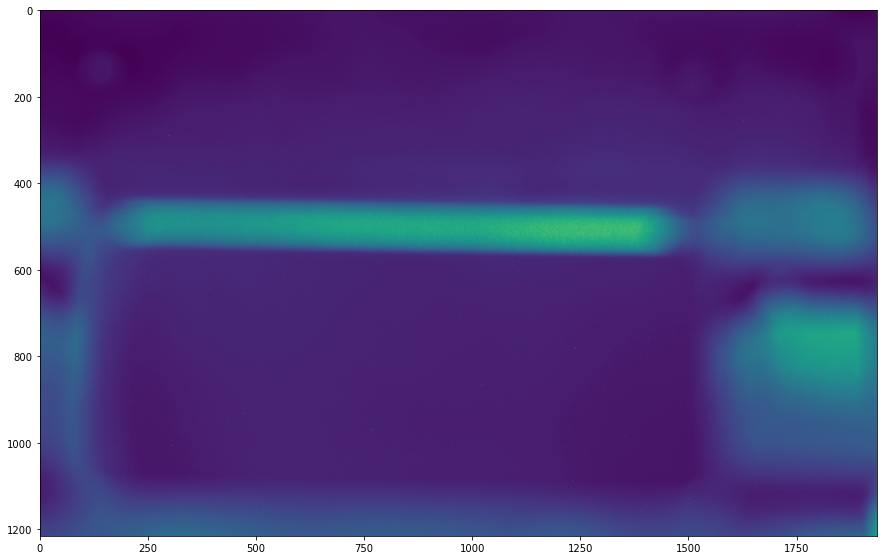

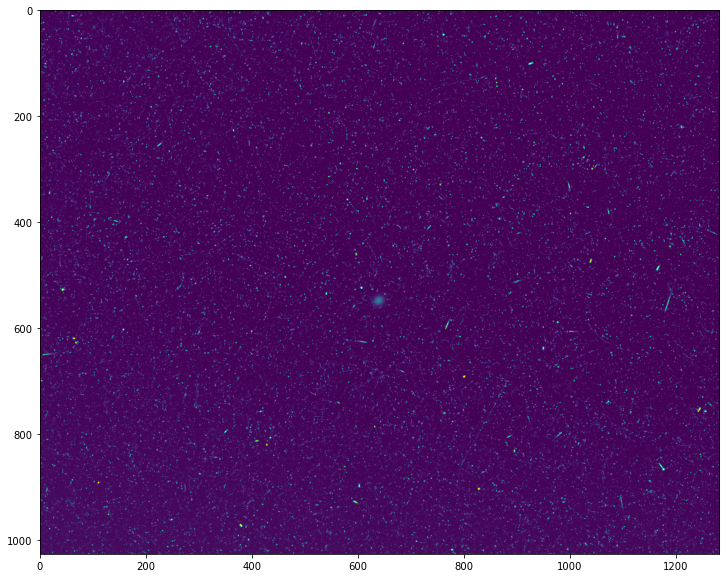

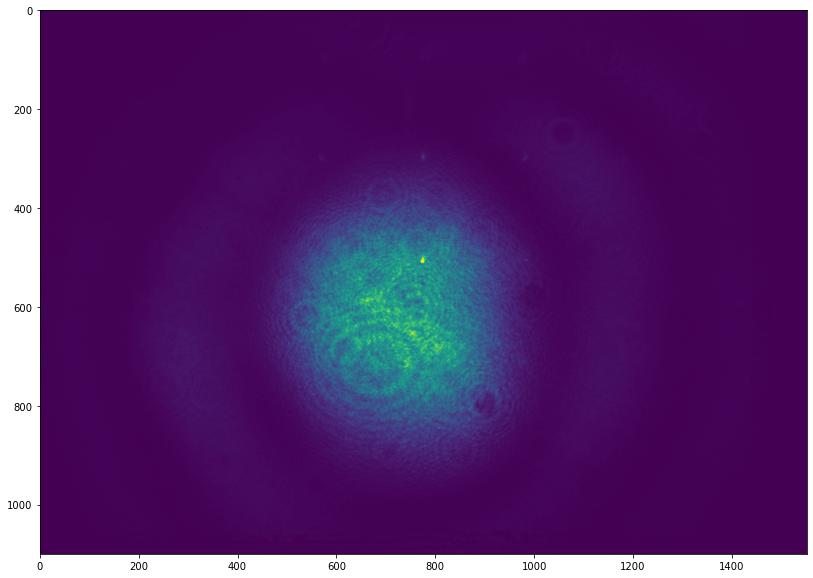

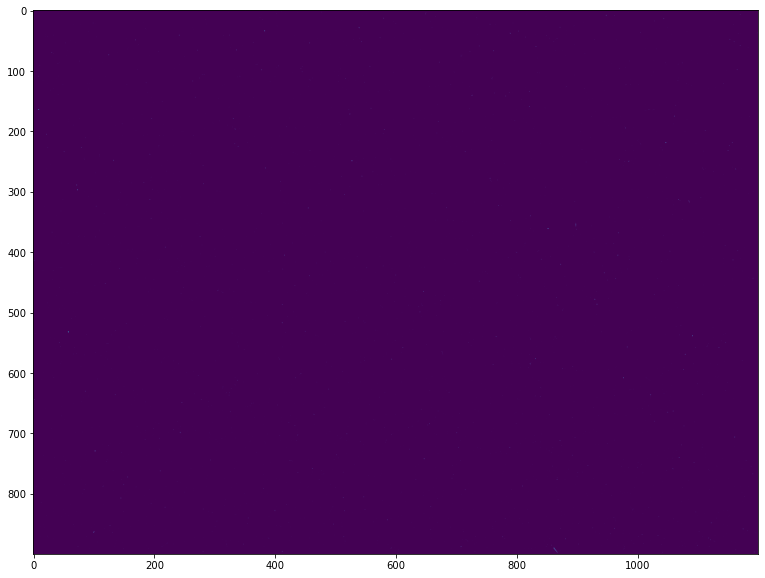

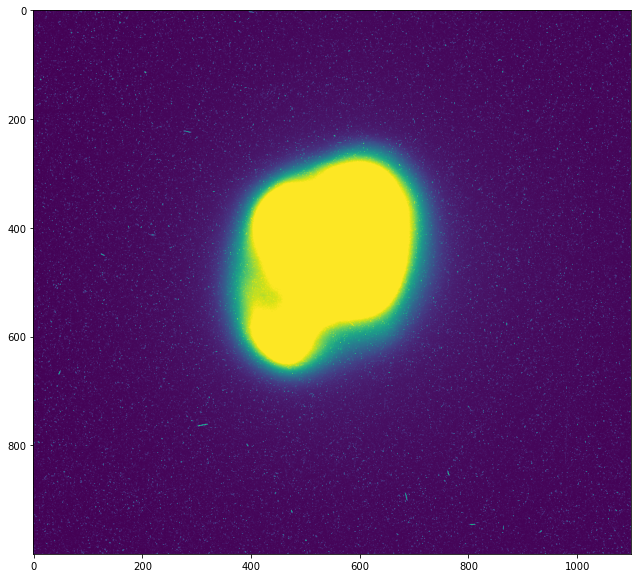

In [23]:
for n in np.arange(0,len(list_screens),1):
    check_screen_count('2024/09/14', list_screens[n])

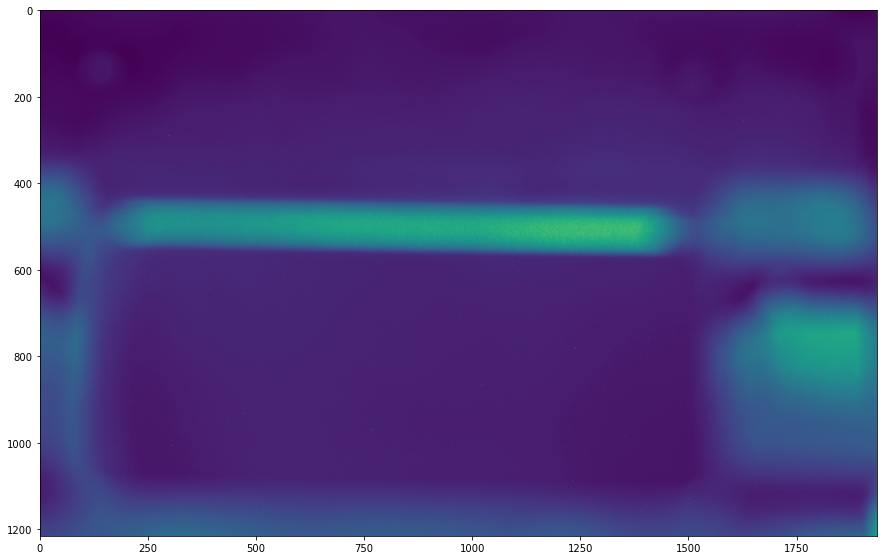

In [17]:
## EXT VOL

files = os.listdir('/eos/experiment/awake/event_data/2024/09/14')
f_t = h5py.File('/eos/experiment/awake/event_data/2024/09/14/'+files[491],'r')
EV1 = f_t['AwakeEventData']['TT41.BTV.412354.EXPVOL1.DigiCam']['ExtractionImage']['image2D'][:]
    
plt.figure(figsize=(15,10))
plt.imshow(EV1)

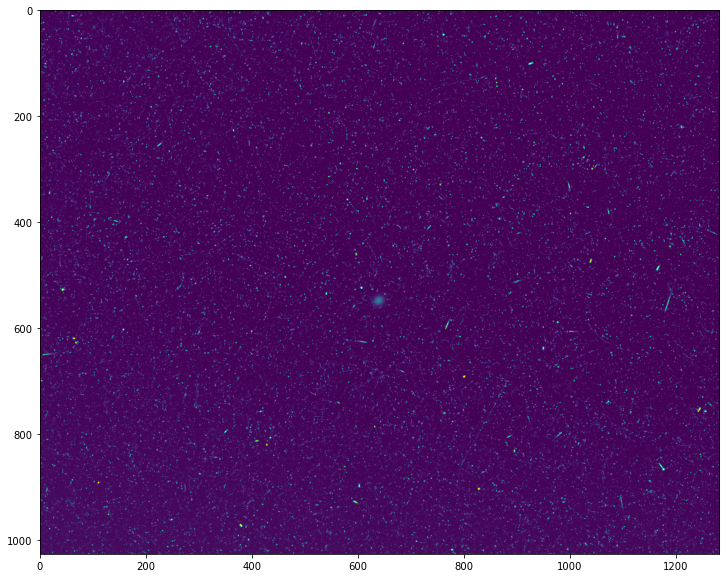

In [18]:
## 54

files = os.listdir('/eos/experiment/awake/event_data/2024/09/14')
f_t = h5py.File('/eos/experiment/awake/event_data/2024/09/14/'+files[149],'r')
EV1 = f_t['AwakeEventData']['TT41.BTV.412354.DigiCam']['ExtractionImage']['image2D'][:]
    
plt.figure(figsize=(15,10))
plt.imshow(EV1)

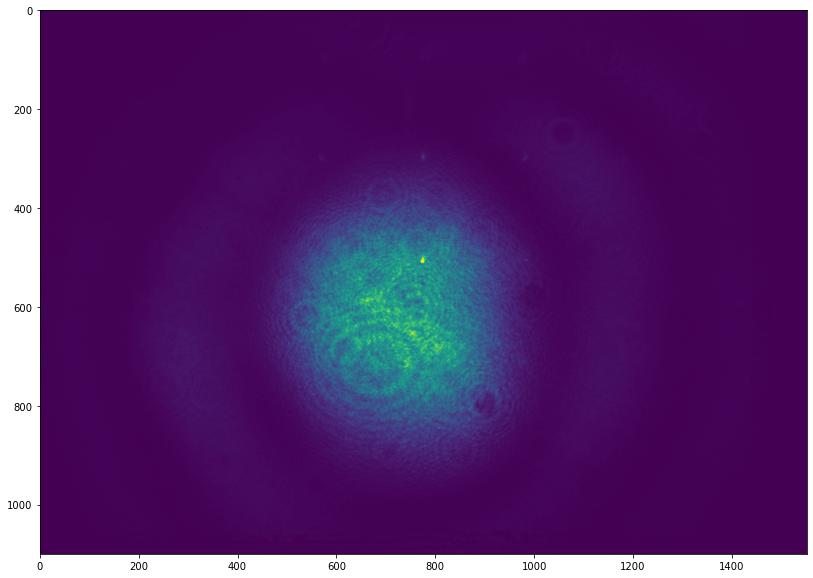

In [19]:
## 53

files = os.listdir('/eos/experiment/awake/event_data/2024/09/14')
f_t = h5py.File('/eos/experiment/awake/event_data/2024/09/14/'+files[81],'r')
EV1 = f_t['AwakeEventData']['TT41.BTV.412353.DigiCam']['ExtractionImage']['image2D'][:]
    
plt.figure(figsize=(15,10))
plt.imshow(EV1)

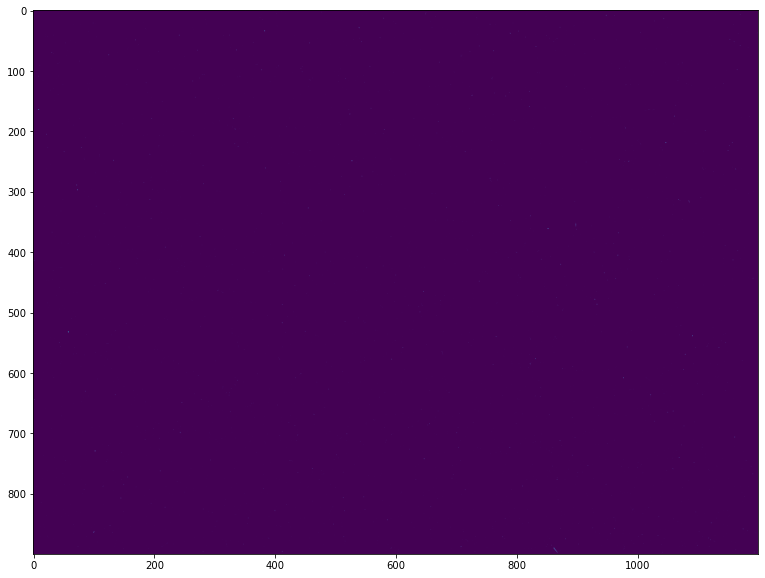

In [20]:
## 50

files = os.listdir('/eos/experiment/awake/event_data/2024/09/14')
f_t = h5py.File('/eos/experiment/awake/event_data/2024/09/14/'+files[135],'r')
EV1 = f_t['AwakeEventData']['TT41.BTV.412350.DigiCam']['ExtractionImage']['image2D'][:]
    
plt.figure(figsize=(15,10))
plt.imshow(EV1)

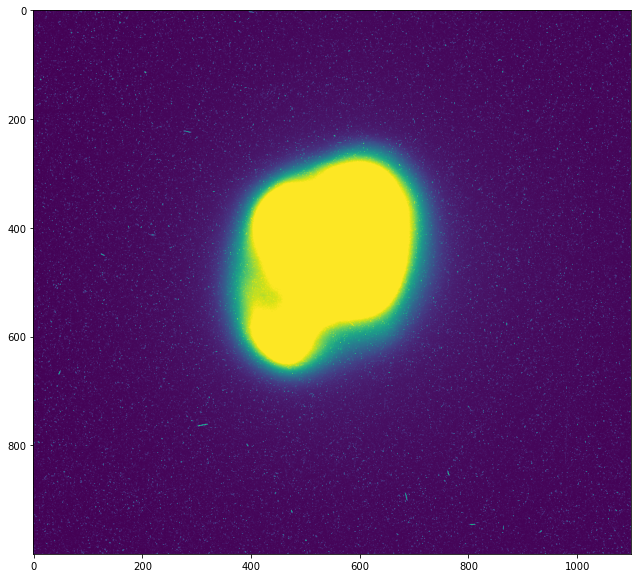

In [21]:
## 426

files = os.listdir('/eos/experiment/awake/event_data/2024/09/14')
f_t = h5py.File('/eos/experiment/awake/event_data/2024/09/14/'+files[495],'r')
EV1 = f_t['AwakeEventData']['TT41.BTV.412426.DigiCam']['ExtractionImage']['image2D'][:]
    
plt.figure(figsize=(15,10))
plt.imshow(EV1)

In [93]:
test_files = os.listdir('/eos/experiment/awake/event_data/2024/09/10')

f1 = h5py.File('/eos/experiment/awake/event_data/2024/09/10/'+test_files[2],'r')
list(f1['AwakeEventData'])

['AIRTR02',
 'EMETER04',
 'EMETER05',
 'LSSE2',
 'LSSP2',
 'RBIH.412435',
 'RPADA.BB4.RQNI.412432',
 'SR.SCOPE43.CH01',
 'TCC4.SPECTRO1.DigiCam',
 'TCC4.SPECTRO2.DigiCam',
 'TCC4.SPECTRO3.DigiCam',
 'TCC4.SPECTRO4.DigiCam',
 'TCC4.SPECTRO5.DigiCam',
 'TCC4.SPECTRO6.DigiCam',
 'TCC4.SPECTRO7.DigiCam',
 'TCV4.UV_CATHODE.DigiCam',
 'TT41.BTV.412354.DigiCam',
 'TT41.BTV.412354.EXPVOL1.DigiCam',
 'TT41.PLASMA.CAM1.DigiCam',
 'TT41.PLASMA.CAM10.DigiCam',
 'TT41.PLASMA.CAM2.DigiCam',
 'TT41.PLASMA.CAM3.DigiCam',
 'TT41.PLASMA.CAM4.DigiCam',
 'TT41.PLASMA.CAM5.DigiCam',
 'TT41.PLASMA.CAM6.DigiCam',
 'TT41.PLASMA.CAM7.DigiCam',
 'TT41.PLASMA.CAM8.DigiCam',
 'TT41.PLASMA.CAM9.DigiCam',
 'TT43.BPM.430010',
 'TT43.BPM.430028',
 'TT43.BPM.430039',
 'TT43.BPM.430103',
 'TT43.BPM.430129',
 'TT43.BPM.430203',
 'TT43.BPM.430308',
 'TT43.BTV.430042.DigiCam',
 'TT43.BTV.430106.DigiCam',
 'XUCL-SPECTRO']

In [85]:
list(f['AwakeEventData'])

['AIRTR01',
 'AIRTR02',
 'AWAKE.XAWAV2_DF_TC200_MV',
 'AWAKE.XAWAV2_DJ_PV252',
 'AWAKE.XAWAV2_PE_P1_ST',
 'AWAKE.XAWAV2_PE_P2_ST',
 'AWAKE.XAWAV2_PE_P3_ST',
 'AWAKE.XAWAV2_PE_P4_ST',
 'AWAKE.XAWAV2_PE_P5_ST',
 'AWAKE.XAWAV2_PE_TC302_MV',
 'AWAKE.XAWAV2_PE_TC312_MV',
 'AWAKE.XAWAV2_PE_TC322_MV',
 'AWAKE.XAWAV2_PE_TC332_MV',
 'AWAKE.XAWAV2_PE_TC342_MV',
 'AWAKE.XAWAV2_PE_TC352_MV',
 'AWAKE.XAWAV2_PE_TC362_MV',
 'AWAKE.XAWAV2_PE_TC372_MV',
 'AWAKE.XAWAV2_PE_TC382_MV',
 'AWAKE.XAWAV2_PG_P10_ST',
 'AWAKE.XAWAV2_PG_P6_ST',
 'AWAKE.XAWAV2_PG_P7_ST',
 'AWAKE.XAWAV2_PG_P8_ST',
 'AWAKE.XAWAV2_PG_P9_ST',
 'AWAKE.XAWAV2_PG_TT404C',
 'AWAKE.XAWAV2_UF_TC100_MV',
 'AWAKE.XAWAV2_UJ_PV152',
 'AWAKEInjPhaseShifter',
 'BLMITT41',
 'BPM.AWAKE.TT41',
 'BTV.TT41.412350_FOCUS',
 'BTV.TT41.412350_STREAK_H',
 'BTV.TT41.412350_STREAK_V',
 'BTV.TT41.412354_FILTER',
 'BTV.TT41.412426_FWHEEL',
 'BTV.TT41.412426_MASK_H',
 'BTV.TT41.412426_MASK_V',
 'BTV.TT41.412442_FWHEEL',
 'BTV.TT41.412442_MASK_H',
 'BTV.TT41.412

# Example threshold sorting with screen 426 & 53

In [4]:
def sort_screen(date,screen,threshold):
        
    files = os.listdir('/eos/experiment/awake/event_data/'+date)
    screen_position = []

    for i in np.arange(0,len(files),1):
        f = h5py.File('/eos/experiment/awake/event_data/'+date+'/'+files[i],'r')
        screen_of_interest = f['AwakeEventData'][screen]['ExtractionImage']['image2D'][:]

        total_count = np.sum(screen_of_interest)
        if total_count > threshold:
            screen_position.append(1)
            
        else:
            screen_position.append(0)

    
    return screen_position

In [31]:
sort_screen426('2024/10/08','TT41.BTV.412426.DigiCam',180000000)

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1]

In [17]:
files = os.listdir('/eos/experiment/awake/event_data/'+'2024/10/08')

rif_data = {}

screen426_position = sort_screen('2024/10/08','TT41.BTV.412426.DigiCam',180000000)

for i in range(len(files)):
    
    files, data, protons, rif, density = load_data(i,1)
    bg_sensor = subtract_sensor('2024/10/08',i,1,3.78126279)
    w_median_filter = ski.filters.median(bg_sensor, footprint=disk(4)) 
        
    if rif not in rif_data:
        rif_data[rif] = {'fit_parameters': [], 'proton_count': [],'density': [], '426_screen': []}
        
    
    # Store values for the corresponding RIF
    rif_data[rif]['fit_parameters'].append(np.mean(w_median_filter))
    rif_data[rif]['proton_count'].append(protons)
    rif_data[rif]['density'].append(density)
    rif_data[rif]['426_screen'].append(screen426_position[i])

In [37]:
#rif_data[rif]['426_screen']

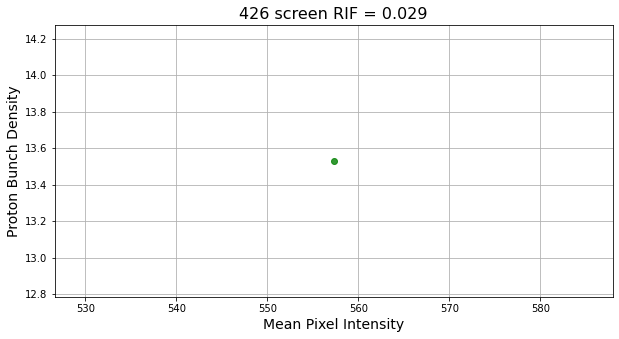

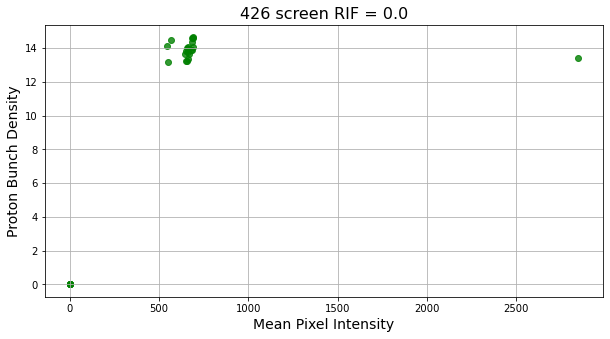

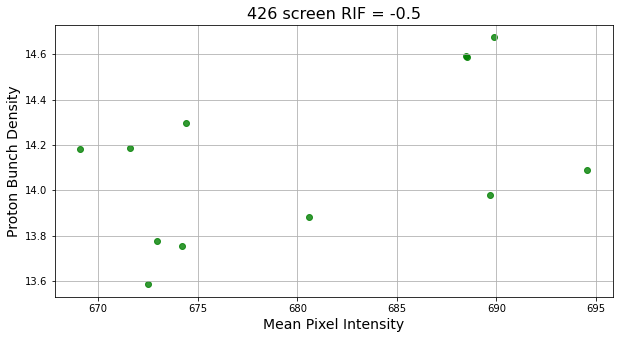

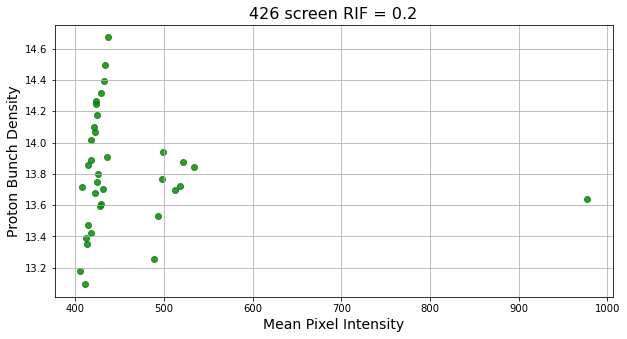

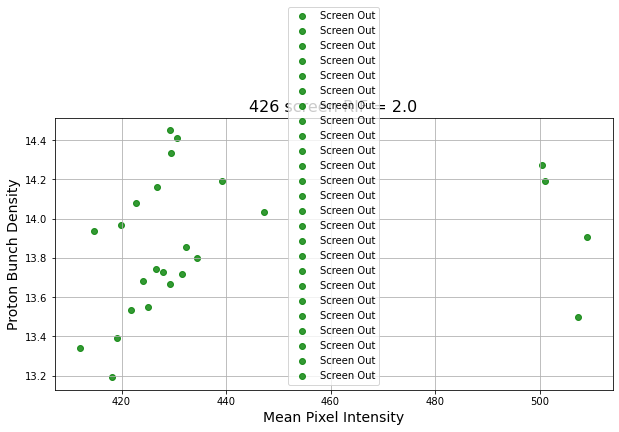

In [16]:
for rif, data in rif_data.items():
    fig, ax = plt.subplots(figsize=(10, 5))  # Create a new figure for each RIF
    
    for i in np.arange(0,len(data['426_screen']),1):
        if data['426_screen'][i] == True:
            sc = ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color='r', alpha=0.8,label='Screen In')
            
        if data['426_screen'][i] == False:
            sc = ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color='g', alpha=0.8,label='Screen Out')
    
    ax.set_title(f'426 screen RIF = {round(rif-1121740.74,4)}', fontsize=16)
    ax.set_xlabel('Mean Pixel Intensity', fontsize=14)
    ax.set_ylabel('Proton Bunch Density', fontsize=14)
    ax.grid()

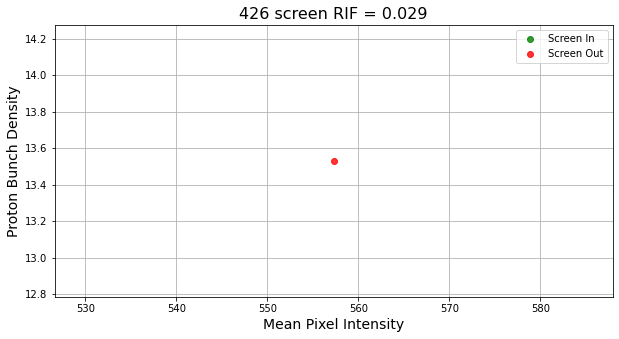

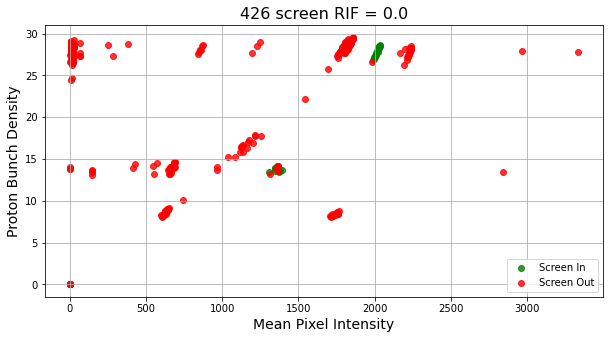

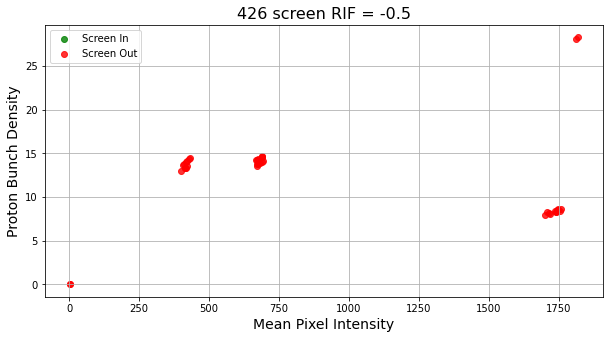

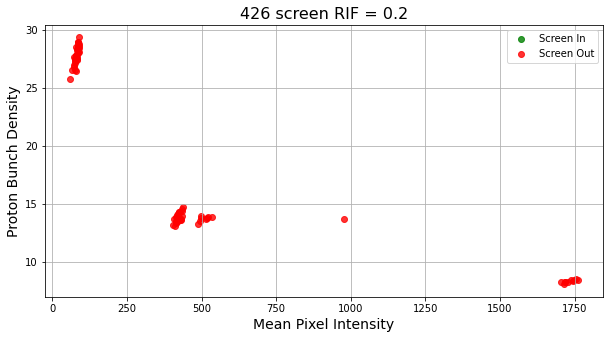

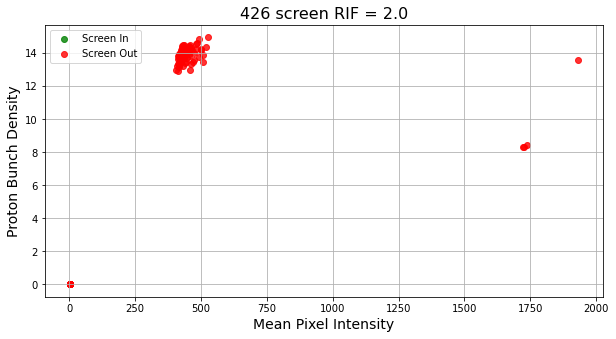

...

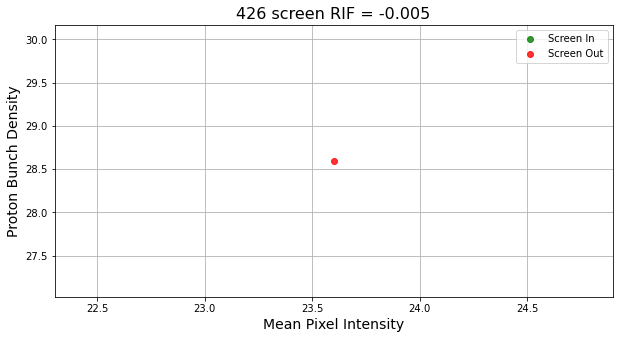

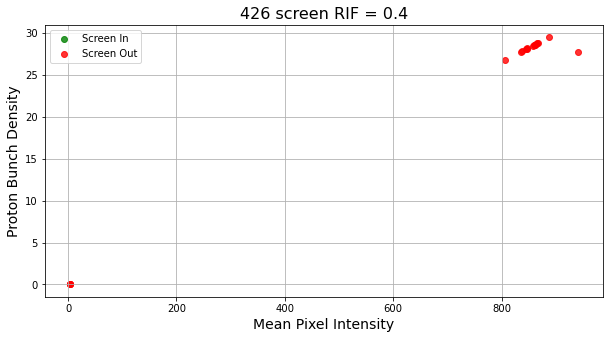

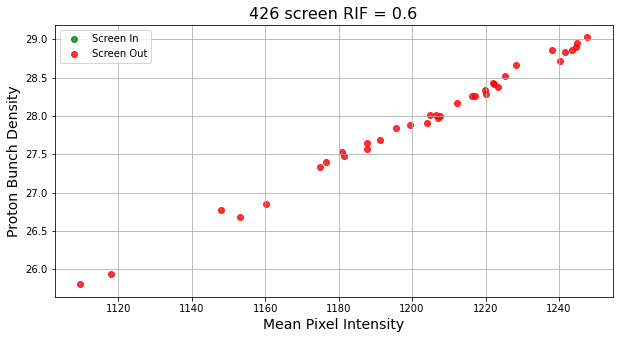

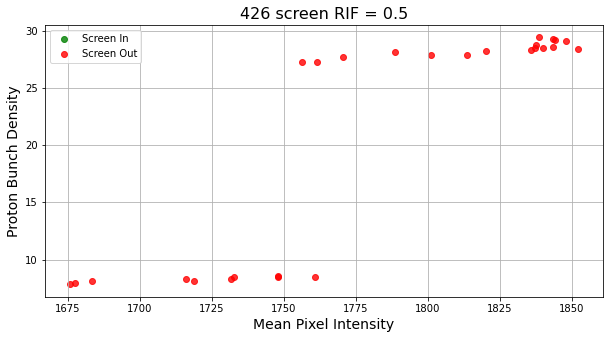

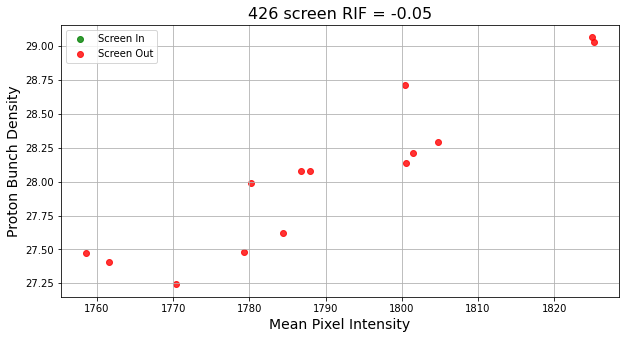

In [20]:
for rif, data in rif_data.items():
    fig, ax = plt.subplots(figsize=(10, 5))

    # Convert lists to numpy arrays for easier masking
    fit_parameters = np.array(data['fit_parameters'])
    proton_count = np.array(data['proton_count'])
    screen426 = np.array(data['426_screen'])

    # Create masks for screen in and out
    mask_in = screen426 == True
    mask_out = screen426 == False

    # Plot screen in
    ax.scatter(fit_parameters[mask_in], proton_count[mask_in], color='g', alpha=0.8, label='Screen In')
    
    # Plot screen out 
    ax.scatter(fit_parameters[mask_out], proton_count[mask_out], color='r', alpha=0.8, label='Screen Out')

    ax.set_title(f'426 screen RIF = {round(rif - 1121740.74, 4)}', fontsize=16)
    ax.set_xlabel('Mean Pixel Intensity', fontsize=14)
    ax.set_ylabel('Proton Bunch Density', fontsize=14)
    ax.grid()
    ax.legend()

    plt.show()

In [22]:
files = os.listdir('/eos/experiment/awake/event_data/'+'2024/10/08')

rif_data = {}

screen426_position = sort_screen('2024/10/08','TT41.BTV.412353.DigiCam',240000000)

for i in range(len(files)):
    
    files, data, protons, rif, density = load_data(i,1)
    bg_sensor = subtract_sensor('2024/10/08',i,1,3.78126279)
    w_median_filter = ski.filters.median(bg_sensor, footprint=disk(4)) 
        
    if rif not in rif_data:
        rif_data[rif] = {'fit_parameters': [], 'proton_count': [],'density': [], '53_screen': []}
        
    
    # Store values for the corresponding RIF
    rif_data[rif]['fit_parameters'].append(np.mean(w_median_filter))
    rif_data[rif]['proton_count'].append(protons)
    rif_data[rif]['density'].append(density)
    rif_data[rif]['53_screen'].append(screen426_position[i])

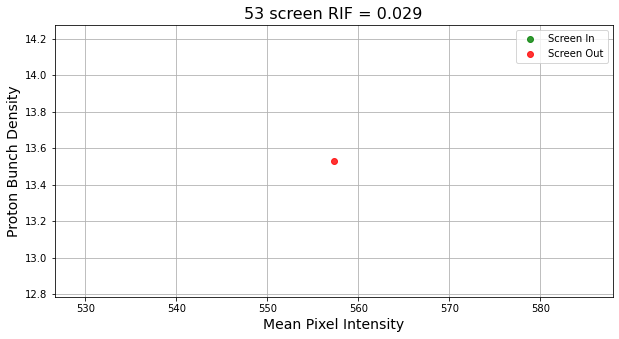

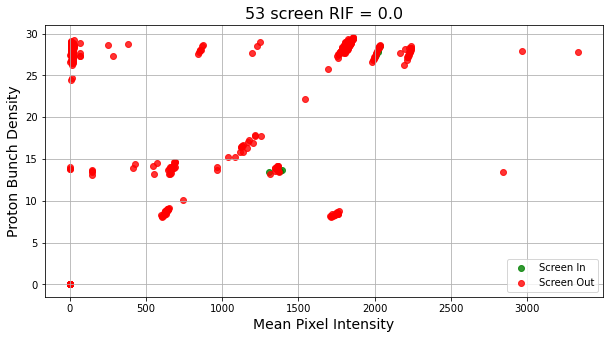

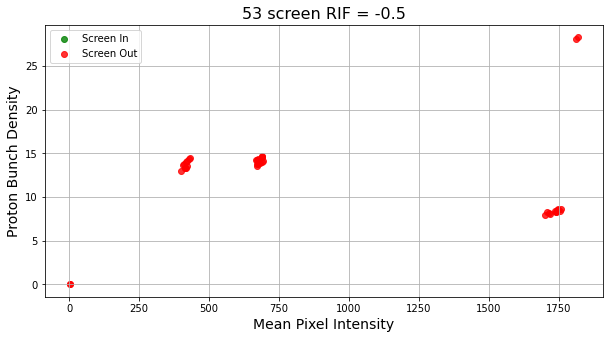

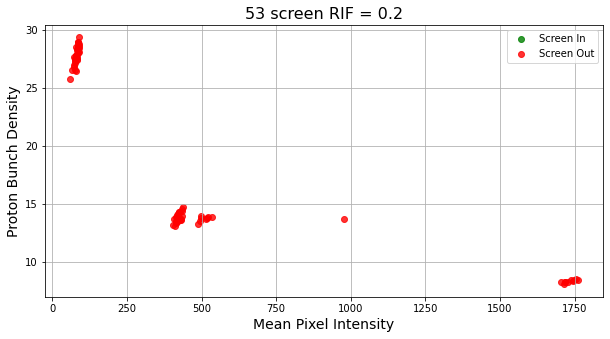

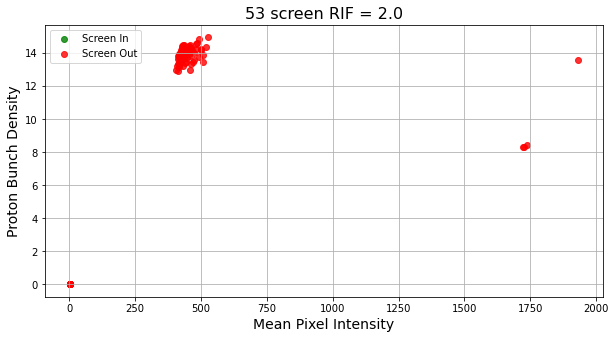

...

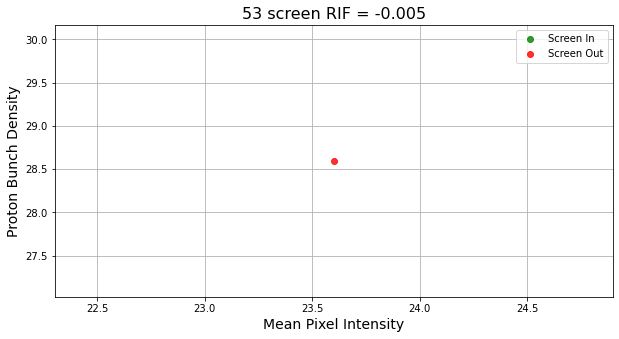

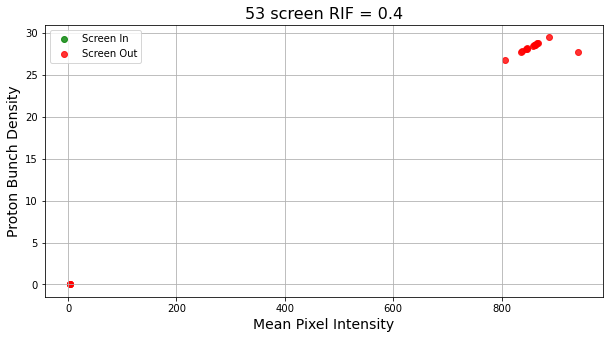

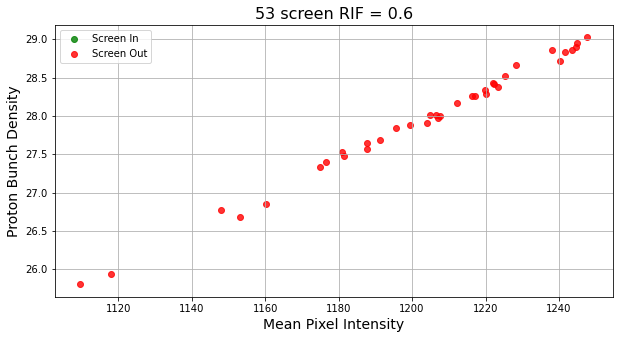

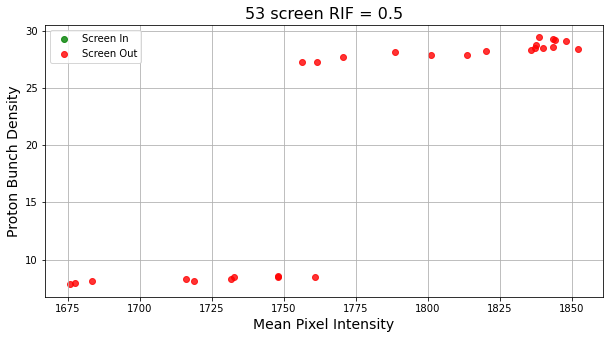

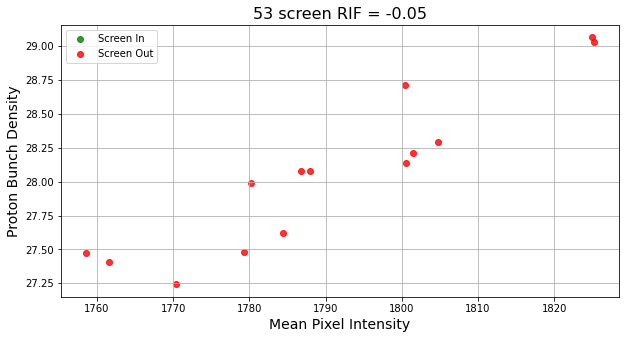

In [23]:
for rif, data in rif_data.items():
    fig, ax = plt.subplots(figsize=(10, 5))

    # Convert lists to numpy arrays for easier masking
    fit_parameters = np.array(data['fit_parameters'])
    proton_count = np.array(data['proton_count'])
    screen426 = np.array(data['53_screen'])

    # Create masks for screen in and out
    mask_in = screen426 == True
    mask_out = screen426 == False

    # Plot screen in
    ax.scatter(fit_parameters[mask_in], proton_count[mask_in], color='g', alpha=0.8, label='Screen In')
    
    # Plot screen out 
    ax.scatter(fit_parameters[mask_out], proton_count[mask_out], color='r', alpha=0.8, label='Screen Out')

    ax.set_title(f'53 screen RIF = {round(rif - 1121740.74, 4)}', fontsize=16)
    ax.set_xlabel('Mean Pixel Intensity', fontsize=14)
    ax.set_ylabel('Proton Bunch Density', fontsize=14)
    ax.grid()
    ax.legend()

    plt.show()

# Screen Position Sorting (2025)

In [40]:
DATA_PATH = Path('/eos/experiment/awake/event_data')
EVENT_DATE = '2025/05/20'

In [39]:
def find_screens(event_no):
    
    current_day_files = (DATA_PATH / EVENT_DATE).iterdir()
    with h5py.File(DATA_PATH / EVENT_DATE / current_day_files[event_no].name, 'r') as f:
        data = f['AwakeEventData']

        screens = {
            'OTR': bool(data['MPP-VACTRANS-OTR']['Acquisition']['end_switch_plus_active']),
            'CTR': bool(data['MPP-VACTRANS-CTR']['Acquisition']['end_switch_plus_active']),
            'LBDP': data['LBDP2']['Acq']['position'][0],
            'BTV50': data['TT41.BTV.412350.BTVI']['SisAcquisition']['screenIn'][0],
            'BTV53': data['TT41.BTV.412353.BTVI']['SisAcquisition']['screenIn'][0],
            'BTV426': data['TT41.BTV.412426.BTVI']['SisAcquisition']['screenIn'][0],
            'BTV442': data['TT41.BTV.412442.BTVI']['SisAcquisition']['screenIn'][0],
        }
        
    return screens

In [117]:
def load_all_event_data(event_filename,spectro_no):
    
    with h5py.File('/eos/experiment/awake/event_data/2025/05/23/'+ event_filename, 'r') as f:
        root = f['AwakeEventData']

        # Main data
        spectro_path = f'TCC4.SPECTRO{spectro_no}.DigiCam'
        data = root[spectro_path]['ExtractionImage']['image2D'][:]
        try:
            protons = root['TT41.BCTF.412340']['CaptureAcquisition']['totalIntensity'][0]
        except(ValueError, KeyError):
            print(i)
            protons = 0
        rif = root['Sps2AwakeSynchro']['ProtonDelayNs']['delay'][0]
        density = root['TSG41.AWAKE-DENSITY-DATA']['ValueAcquisition']['floatValue'][2]

        # Screens
        screens = {
            'OTR': bool(root['MPP-VACTRANS-OTR']['Acquisition']['end_switch_plus_active']),
            'CTR': bool(root['MPP-VACTRANS-CTR']['Acquisition']['end_switch_plus_active']),
            'LDBP': root['LBDP2']['Acq']['position'][0],
            'BTV50': root['TT41.BTV.412350.BTVI']['SisAcquisition']['screenIn'][0],
            'BTV53': root['TT41.BTV.412353.BTVI']['SisAcquisition']['screenIn'][0],
            'BTV426': root['TT41.BTV.412426.BTVI']['SisAcquisition']['screenIn'][0],
            'BTV442': root['TT41.BTV.412442.BTVI']['SisAcquisition']['screenIn'][0],
        }

    return data, protons, rif, density, screens

In [4]:
files = os.listdir('/eos/experiment/awake/event_data/2025/05/20')
f3 = h5py.File('/eos/experiment/awake/event_data/2025/05/20/'+files[10],'r')

In [6]:
list(f3['AwakeEventData'])

['AIRTR01',
 'AIRTR02',
 'AWAKE.XAWAV2_DF_TC200_MV',
 'AWAKE.XAWAV2_DJ_PV252',
 'AWAKE.XAWAV2_PE_P1_ST',
 'AWAKE.XAWAV2_PE_P2_ST',
 'AWAKE.XAWAV2_PE_P3_ST',
 'AWAKE.XAWAV2_PE_P4_ST',
 'AWAKE.XAWAV2_PE_P5_ST',
 'AWAKE.XAWAV2_PE_TC302_MV',
 'AWAKE.XAWAV2_PE_TC312_MV',
 'AWAKE.XAWAV2_PE_TC322_MV',
 'AWAKE.XAWAV2_PE_TC332_MV',
 'AWAKE.XAWAV2_PE_TC342_MV',
 'AWAKE.XAWAV2_PE_TC352_MV',
 'AWAKE.XAWAV2_PE_TC362_MV',
 'AWAKE.XAWAV2_PE_TC372_MV',
 'AWAKE.XAWAV2_PE_TC382_MV',
 'AWAKE.XAWAV2_PG_P10_ST',
 'AWAKE.XAWAV2_PG_P6_ST',
 'AWAKE.XAWAV2_PG_P7_ST',
 'AWAKE.XAWAV2_PG_P8_ST',
 'AWAKE.XAWAV2_PG_P9_ST',
 'AWAKE.XAWAV2_PG_TT404C',
 'AWAKE.XAWAV2_UF_TC100_MV',
 'AWAKE.XAWAV2_UJ_PV152',
 'AWAKEInjPhaseShifter',
 'BLMITT41',
 'BPM.AWAKE.TT41',
 'BTV.TT41.412350_FOCUS',
 'BTV.TT41.412350_STREAK_H',
 'BTV.TT41.412350_STREAK_V',
 'BTV.TT41.412354_FILTER',
 'BTV.TT41.412426_FWHEEL',
 'BTV.TT41.412426_MASK_H',
 'BTV.TT41.412426_MASK_V',
 'BTV.TT41.412442_FWHEEL',
 'BTV.TT41.412442_MASK_H',
 'BTV.TT41.412

In [115]:
EVENT_DATE = '2025/05/23'
DATA_PATH = f'/eos/experiment/awake/event_data/{EVENT_DATE}'

In [121]:
rif_data = {}

event_files = os.listdir(DATA_PATH)
#print(event_files)

for i in np.arange(0,len(event_files),1):
    filename = event_files[i]
    #print(filename)
    
    data, protons, rif, density, screens = load_all_event_data(filename,spectro_no=1)
    print(rif)

    bg_sensor = subtract_sensor(EVENT_DATE,i,1,3.78126279)
    w_median_filter = ski.filters.median(bg_sensor, footprint=disk(4)) 
    
    
    if rif not in rif_data:
        rif_data[rif] = {'fit_parameters': [], 'proton_count': [],'density': [], 'OTR_screen': [],'CTR_screen': [],'LDBP_screen': [],
                        'BTV50_screen': [],'BTV53_screen': [],'BTV426_screen': [], 'BTV442_screen': []}
        
    
    # Store values for the corresponding RIF
    rif_data[rif]['fit_parameters'].append(np.mean(w_median_filter))
    rif_data[rif]['proton_count'].append(protons)
    rif_data[rif]['density'].append(density)
    
    ## Store screen positions
    rif_data[rif]['OTR_screen'].append(screens['OTR'])
    rif_data[rif]['CTR_screen'].append(screens['CTR'])
    rif_data[rif]['LDBP_screen'].append(screens['LDBP'])
    rif_data[rif]['BTV50_screen'].append(screens['BTV50'])
    rif_data[rif]['BTV53_screen'].append(screens['BTV53'])
    rif_data[rif]['BTV426_screen'].append(screens['BTV426'])
    rif_data[rif]['BTV442_screen'].append(screens['BTV442'])

1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
47
1132482.551
48
1132482.551
49
1132482.551
50
1132482.551
51
1132482.551
52
1132482.551
53
1132482.551
54
1132482.551
55
1132482.551
56
1132482.551
57
1132482.551
58
1132482.551
59
1132482.551
60
1132482.551
61
1132482.551
62
1132482.551
63
1132482.551
64
1132482.551
65
1132482.551
66
1132482.551
67
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1132482.551
1

1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132483.201
1132

In [82]:
#1132483.227-1121740.74

In [111]:
rif_data[rif]

{'fit_parameters': [-3.7812534449043276,
  -3.7812033212092424,
  213.32812665242145,
  -3.7812088433112434,
  211.32568121078924,
  217.24296946791188,
  214.97682114255304,
  211.01788604169394,
  216.52224722794344,
  211.97008672677444,
  205.72041465467785,
  206.32747079661456,
  206.37004790214957,
  206.19218099670155,
  207.09755595592296,
  207.29374859402648,
  208.66306847495298,
  206.81449130825007,
  208.9276646648725,
  207.24041315946255,
  208.83222787509976,
  205.33802820608608,
  209.29133968322287,
  207.24395155251386,
  206.01258439899604,
  209.39992884563043,
  211.0125852485502,
  207.34564700773896,
  207.49562305031182,
  210.06433244162326,
  208.02419185740186,
  209.59085084976266,
  208.68903000034445,
  210.92129555738012,
  208.73743122438208,
  206.87980333249973,
  207.49468641685706,
  206.64784871228443,
  208.40691600376985,
  204.94053243686577,
  205.69039353476157,
  208.78703541710172,
  -3.781241126369095,
  -3.781241126369095,
  -3.78123517

In [109]:
screen_colours = {
    'OTR': 'red',
    'CTR': 'blue',
    'BTV50': 'green',
    'BTV53': 'orange',
    'BTV426': 'purple',
    'BTV442': 'brown',
    'LDBP': 'cyan',
    'None': 'navy'
}

def plot_all_screens_per_rif(rif_data):
    for rif, data in rif_data.items():
        fig, ax = plt.subplots(figsize=(10, 6))

        for i in range(len(data['fit_parameters'])):  
            active_screens = []

            # Determine which screen is active
            screen_used = None
            for screen in screen_colours:
                if screen == 'None':
                    continue  

                val = data.get(f'{screen}_screen', [None])[i]

                if isinstance(val, bool) and val:
                    active_screens.append(screen)
                elif isinstance(val, numbers.Number) and val == 1.0:
                    active_screens.append(screen)

            if not active_screens:
                active_screens = ['None']

            # Create a combined label
            screen_label = '+'.join(active_screens)
            colour = screen_colours.get(active_screens[0], 'gray')
            ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color=colour, label=screen_label, alpha=0.8)

        ax.set_title(f'RIF Offset = {round(rif - 1121740.74, 4)}', fontsize=16)
        ax.set_xlabel('Mean Pixel Intensity', fontsize=14)
        ax.set_ylabel('Proton Bunch Density', fontsize=14)
        ax.grid()

        handles, labels = ax.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        ax.legend(by_label.values(), by_label.keys(), title="Screen Active", loc='best')

        plt.tight_layout()
        plt.show()

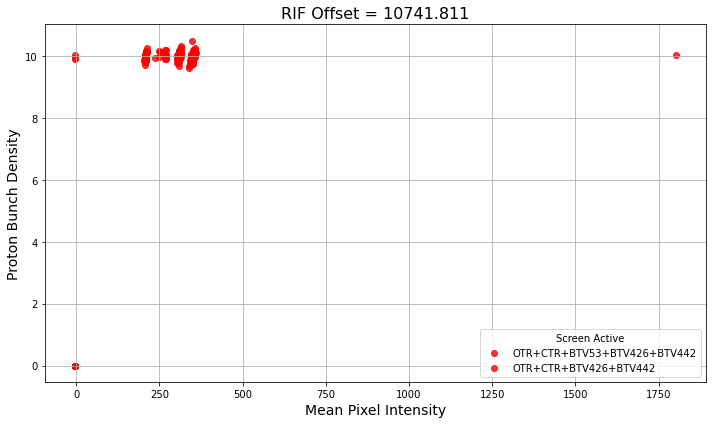

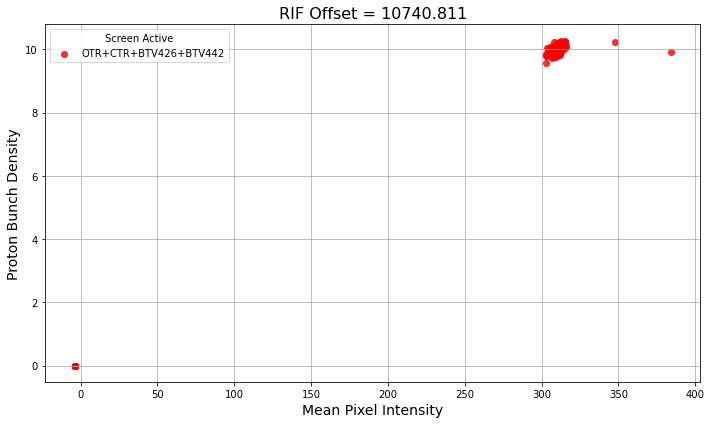

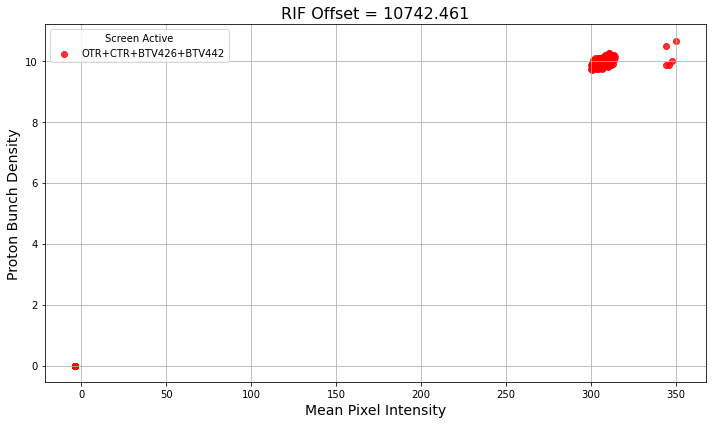

In [122]:
plot_all_screens_per_rif(rif_data)

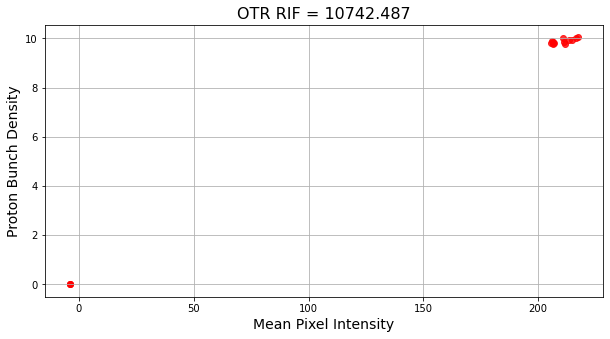

In [91]:
for rif, data in rif_data.items():
    fig, ax = plt.subplots(figsize=(10, 5))  # Create a new figure for each RIF
    
    for i in np.arange(0,len(data['LDBP_screen']),1):
        if data['OTR_screen'][i] == True:
            sc = ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color='r', alpha=0.8)
            
        if data['OTR_screen'][i] == False:
            sc = ax.scatter(data['fit_parameters'][i], data['proton_count'][i], color='g', alpha=0.8)
    
    ax.set_title(f'OTR RIF = {round(rif-1121740.74,4)}', fontsize=16)
    ax.set_xlabel('Mean Pixel Intensity', fontsize=14)
    ax.set_ylabel('Proton Bunch Density', fontsize=14)
    ax.grid()

In [34]:
##list(f1['AwakeEventData']['TT41.BTV.412354.DigiCam']['AcquiredParameters'])

In [21]:
test_files = os.listdir('/eos/experiment/awake/event_data/2025/05/20')

f1 = h5py.File('/eos/experiment/awake/event_data/2025/05/20/'+test_files[2],'r')
list(f1['AwakeEventData'])

['AIRTR01',
 'AIRTR02',
 'AWAKE.XAWAV2_DF_TC200_MV',
 'AWAKE.XAWAV2_DJ_PV252',
 'AWAKE.XAWAV2_PE_P1_ST',
 'AWAKE.XAWAV2_PE_P2_ST',
 'AWAKE.XAWAV2_PE_P3_ST',
 'AWAKE.XAWAV2_PE_P4_ST',
 'AWAKE.XAWAV2_PE_P5_ST',
 'AWAKE.XAWAV2_PE_TC302_MV',
 'AWAKE.XAWAV2_PE_TC312_MV',
 'AWAKE.XAWAV2_PE_TC322_MV',
 'AWAKE.XAWAV2_PE_TC332_MV',
 'AWAKE.XAWAV2_PE_TC342_MV',
 'AWAKE.XAWAV2_PE_TC352_MV',
 'AWAKE.XAWAV2_PE_TC362_MV',
 'AWAKE.XAWAV2_PE_TC372_MV',
 'AWAKE.XAWAV2_PE_TC382_MV',
 'AWAKE.XAWAV2_PG_P10_ST',
 'AWAKE.XAWAV2_PG_P6_ST',
 'AWAKE.XAWAV2_PG_P7_ST',
 'AWAKE.XAWAV2_PG_P8_ST',
 'AWAKE.XAWAV2_PG_P9_ST',
 'AWAKE.XAWAV2_PG_TT404C',
 'AWAKE.XAWAV2_UF_TC100_MV',
 'AWAKE.XAWAV2_UJ_PV152',
 'AWAKEInjPhaseShifter',
 'BLMITT41',
 'BPM.AWAKE.TT41',
 'BTV.TT41.412350_FOCUS',
 'BTV.TT41.412350_STREAK_H',
 'BTV.TT41.412350_STREAK_V',
 'BTV.TT41.412354_FILTER',
 'BTV.TT41.412426_FWHEEL',
 'BTV.TT41.412426_MASK_H',
 'BTV.TT41.412426_MASK_V',
 'BTV.TT41.412442_FWHEEL',
 'BTV.TT41.412442_MASK_H',
 'BTV.TT41.412

In [28]:
f1['AwakeEventData']['TT41.BTV.412350.BTVI']['SisAcquisition']['screenIn'][0]

0